## Advanced Data Analytics for Management Support - Assignment Submission

## Table of Contents
    
    1. Introduction
    2. Data Seperation
    3. Numeric Data
        3.1 Numeric Data Exploratory Data Analysis
            3.1.1 Target Variable
            3.1.2 Accommodations Details
            3.1.3 Review Scores
            3.1.4 Host Information
            3.1.5 Density Maps
            3.1.6 Correlation Matrix
        3.2 Numeric Data Preprocessing
    4. Text Data
        4.1 Text Data Preprocessing
        4.2 Text Data Exploratory Data Analysis
            4.2.1 Most Used Words
            4.2.2 Distribution of Word Counts
        4.3 GloVe Embeddings
    5. Model Building and Evaluation
        5.2 Numeric Prediction
            5.2.1 Linear Regression
            5.2.2 Random Forest
            5.2.3 XGBoost
            5.2.4 Feedfoward Neural Network
        5.3 Text Prediction
            5.3.2 LSTM
            5.3.3 BiLSTM
            5.3.4 DistelBERT
        5.4 Numeric & Text Prediction as Final Model
    6. Application to Test Set
    7. Conclusion


## 1. Introduction

The online platform Airbnb, since its founding in 2008, has transformed into a massive marketplace for renting options, spanning across private individuals to businesses. What is fascinating is the freedom given to hosts to set the rental price, which may depend on known and unknown factors.

Our mission? To predict these rental prices for Airbnb listings situated in London.

We have access to data on more than 55,000 properties, each containing a mix of textual and numerical attributes. These features include location, number of rooms, property type and descriptive text about the listings and more. Most importantly, the dataset also includes the rental price per night. The key challenge is to use NLP techniques to develop a model that combines textual descriptions and numerical attributes to achieve the lowest possible RMSE for predicting rental prices per night.

In [195]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

from collections import Counter
from wordcloud import WordCloud
import plotly.express as px
from IPython.display import Image

import nltk
import re
nltk.download('punkt')
nltk.download('stopwords')
nltk.download('wordnet')
from nltk.tokenize import word_tokenize
from nltk.corpus import stopwords
from nltk.stem import PorterStemmer
from nltk.stem import WordNetLemmatizer

import string
import random

from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error, r2_score
from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import KFold, cross_val_score
from sklearn.model_selection import GridSearchCV
import xgboost as xgb

import tensorflow as tf
from tensorflow.keras.preprocessing.sequence import pad_sequences
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Embedding, LSTM, Dense, Dropout
from itertools import product
from tensorflow.keras.layers import Bidirectional
from matplotlib.ticker import MaxNLocator
from keras.callbacks import ModelCheckpoint, EarlyStopping
from keras.models import load_model

from transformers import DistilBertTokenizer, DistilBertModel, AdamW, get_linear_schedule_with_warmup
import torch
from torch.utils.data import DataLoader, TensorDataset
import torch.nn as nn
from torch.nn.utils.clip_grad import clip_grad_norm_
from torch.utils.data import Dataset
import torch.nn.functional as F
from torch.utils.data import random_split
from itertools import islice

[nltk_data] Downloading package punkt to
[nltk_data]     C:\Users\I551917\AppData\Roaming\nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\I551917\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package wordnet to
[nltk_data]     C:\Users\I551917\AppData\Roaming\nltk_data...
[nltk_data]   Package wordnet is already up-to-date!


In [3]:
# Import data
df_train = pd.read_csv("train.csv")
df_test = pd.read_csv("test.csv")

After importing the training and testing datasets, we observe that the training set contains 55,284 entries with 42 features, whereas the testing set has 29,769 entries with 41 features. The missing column in the testing set is the "price" variable, which is our target for prediction.

In [4]:
# Overview train data
print(f"Train shape: {df_train.shape}")
df_train.head()

Train shape: (55284, 42)


,name,summary,space,description,experiences_offered,neighborhood_overview,transit,house_rules,picture_url,host_id,...,review_scores_rating,review_scores_accuracy,review_scores_cleanliness,review_scores_checkin,review_scores_communication,review_scores_location,review_scores_value,cancellation_policy,reviews_per_month,listing_id
0,Attic Room in historic Greenwich,The room does not have a door but its own disc...,Double room available in historic royal Greenw...,The room does not have a door but its own disc...,business,NaN,Parking is restricted in London. Visitors park...,no shoes on carpets no food in attic room no o...,https://a0.muscache.com/im/pictures/20045164/7...,2167992,...,95.0,10.0,10.0,10.0,10.0,10.0,10.0,strict_14_with_grace_period,2.37,9Q1RD6H7IO
1,Lovely Garden Studio Private Access,"Garden studio with private entrance, 5 minutes...","Beautiful studio with a king size bed, a sofa ...","Garden studio with private entrance, 5 minutes...",none,Crouch End is a very hip and friendly neighbou...,Walk across the street to the W3 bus stop and ...,We'd love it if you would remove your shoes at...,https://a0.muscache.com/im/pictures/8d1ddcdc-f...,16148175,...,99.0,10.0,10.0,10.0,10.0,10.0,10.0,moderate,2.97,6XDPZPGLSR
2,Comfi apartment 2 close to wimbledon tennis court,NaN,NaN,NaN,none,NaN,NaN,1- No party or event allowed. 2-No smoking ins...,https://a0.muscache.com/im/pictures/e7e4a740-d...,272000199,...,84.0,9.0,9.0,10.0,10.0,9.0,8.0,strict_14_with_grace_period,1.73,SND9OPN6IY
3,Luxury room in the heart of London - SW4,Luxury first floor Victorian split level maiso...,"Your room will be fully furnished, and it will...",Luxury first floor Victorian split level maiso...,none,"Gail coffee shop, just round the corner as wel...",Happy to advise on things to do in London and ...,- Check-in after 18:30pm and no later than 20:...,https://a0.muscache.com/im/pictures/7c2b2fcc-e...,3361233,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,flexible,NaN,SE3B7BXN9G
4,Excellent city Apartment with Private Patio,"NEW luxury apartment, with private outside pat...","A modern, well-equipped, cosy apartment close ...","NEW luxury apartment, with private outside pat...",none,NaN,NaN,"I am very happy for your visit, but please car...",https://a0.muscache.com/im/pictures/ca1494da-f...,94317022,...,100.0,10.0,10.0,10.0,10.0,10.0,10.0,strict_14_with_grace_period,2.32,E0C82VK0VF


In [5]:
# Overview test data
print(f"Test shape: {df_test.shape}")
df_test.head()

Test shape: (29769, 41)


,name,summary,space,description,experiences_offered,neighborhood_overview,transit,house_rules,picture_url,host_id,...,review_scores_rating,review_scores_accuracy,review_scores_cleanliness,review_scores_checkin,review_scores_communication,review_scores_location,review_scores_value,cancellation_policy,reviews_per_month,listing_id
0,Ladbroke Grove Stylish Portobello Apartment,"Large, bright and contemporary flat located in...",NaN,"Large, bright and contemporary flat located in...",none,NaN,NaN,NaN,https://a0.muscache.com/im/pictures/9e15bc56-a...,28086957,...,96.0,10.0,10.0,10.0,10.0,10.0,10.0,flexible,1.89,0FEMC4VA5U
1,Contemporary Design in Notting Hill,Stylish design on a beautiful tree lined stree...,The (Phone number hidden by Airbnb) ) is thoug...,Stylish design on a beautiful tree lined stree...,none,"Notting Hill is a trendy, artistic, bohemian n...",There are 2 underground stations within walkin...,NaN,https://a0.muscache.com/im/pictures/c2ea8799-e...,16965290,...,97.0,10.0,10.0,10.0,10.0,10.0,10.0,flexible,2.50,PQ2BYEO0QR
2,En-suite double bedroom,Quiet en-suite double bedroom in our lovely ho...,NaN,Quiet en-suite double bedroom in our lovely ho...,none,NaN,NaN,NaN,https://a0.muscache.com/im/pictures/4b86abd0-0...,4363076,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,flexible,NaN,3FP6WFHUBN
3,Double room with balcony in magnificent penthouse,My place is close to Aldgate . You’ll love my ...,NaN,My place is close to Aldgate . You’ll love my ...,none,NaN,NaN,"- No parties, events or guests",https://a0.muscache.com/im/pictures/23ea2939-6...,7603738,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,flexible,NaN,GG0V2KDG90
4,The Bockery Suite 2 Chelsea,This 26m2 Suite comprises of 1 bedroom and 1 b...,"Whether it's just for you or your family, whet...",This 26m2 Suite comprises of 1 bedroom and 1 b...,none,When you have had your fill of relaxing in the...,Our visitors often tell us that they had no id...,What you do in the privacy of your own room is...,https://a0.muscache.com/im/pictures/64910777/2...,26586101,...,98.0,10.0,10.0,10.0,10.0,10.0,10.0,moderate,0.95,TZVVK4YSIO


Here, we are examining the dataset's structure, data types, and presence of non-null values across its 42 features.

In [6]:
df_train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 55284 entries, 0 to 55283
Data columns (total 42 columns):
 #   Column                       Non-Null Count  Dtype  
---  ------                       --------------  -----  
 0   name                         55270 non-null  object 
 1   summary                      52330 non-null  object 
 2   space                        38403 non-null  object 
 3   description                  53558 non-null  object 
 4   experiences_offered          55284 non-null  object 
 5   neighborhood_overview        35778 non-null  object 
 6   transit                      35477 non-null  object 
 7   house_rules                  31905 non-null  object 
 8   picture_url                  55284 non-null  object 
 9   host_id                      55284 non-null  int64  
 10  host_since                   55173 non-null  object 
 11  host_response_time           37482 non-null  object 
 12  host_response_rate           37482 non-null  object 
 13  host_is_superhos

---
## 2. Data Separation

For our analysis, separating numeric and text data is crucial to harness the distinct characteristics of each data type, ensuring optimal feature engineering and model performance. We applied this strategic division to both our training and testing datasets to maintain consistency throughout the analysis.

In [7]:
def separate_data(df, threshold=10, train=True):
    # Identify numerical columns
    numerical_cols = df.select_dtypes(include=["int64", "float64"]).columns

    # Identify categorical columns 
    categorical_cols = [col for col in df.select_dtypes(include=["object"]).columns if df[col].nunique() <= threshold]

    # Create df for numerical and categorical data
    df_num = df[numerical_cols.union(categorical_cols)].copy()

    # Create df for non-categorical data 
    df_text = df.drop(numerical_cols.union(categorical_cols), axis=1).copy()

    # Add price column to both df 
    if train == True:
        df_num["price"] = df["price"]
        df_text["price"] = df["price"]

    return df_num, df_text

In [8]:
# Seperate numeric and text data from train data
df_num, df_text = separate_data(df_train)

print(f"Variables numeric train data set: {df_num.shape[1]}")
print(f"Variables text train data set: {df_text.shape[1]}")
print()

# Seperate numeric and text data from train data
df_num2, df_text2 = separate_data(df_test, train=False)

print(f"Variables numeric test data set: {df_num2.shape[1]}")
print(f"Variables text test data set: {df_text2.shape[1]}")

Variables numeric train data set: 26
Variables text train data set: 17

Variables numeric test data set: 25
Variables text test data set: 16


Following our data separation, we recognized that certain columns like "host_since", "host_response_rate", "neighbourhood", "neighbourhood_cleansed", "property_type" and "zipcode" initially categorized as text, can be transformed into numeric (categorical) formats for better modeling efficiency.

In [9]:
transfer_cols = ["host_since", "host_response_rate", "neighbourhood", "neighbourhood_cleansed", 
                 "property_type", "zipcode"]

# Transfer columns from text to numeric df for train data
df_num[transfer_cols] = df_text[transfer_cols]
df_text.drop(transfer_cols, axis=1, inplace=True)

# Transfer columns from text to numeric df for test data
df_num2[transfer_cols] = df_text2[transfer_cols]
df_text2.drop(transfer_cols, axis=1, inplace=True)

By implementing these adjustments, we have streamlined our datasets, creating distinct numeric and textual subsets for both training and testing purposes.

In [10]:
df_num.head()

,accommodates,bathrooms,bed_type,bedrooms,beds,cancellation_policy,experiences_offered,guests_included,host_has_profile_pic,host_id,...,review_scores_rating,review_scores_value,reviews_per_month,room_type,host_since,host_response_rate,neighbourhood,neighbourhood_cleansed,property_type,zipcode
0,2,1.0,Pull-out Sofa,1.0,1.0,strict_14_with_grace_period,business,1,t,2167992,...,95.0,10.0,2.37,Private room,2012-04-18,100%,Greenwich,Greenwich,Townhouse,SE10 8SX
1,2,1.0,Real Bed,1.0,1.0,moderate,none,2,t,16148175,...,99.0,10.0,2.97,Private room,2014-05-29,100%,LB of Haringey,Haringey,Guesthouse,N8 8NR
2,5,1.0,Real Bed,1.0,2.0,strict_14_with_grace_period,none,2,t,272000199,...,84.0,8.0,1.73,Entire home/apt,2019-06-28,100%,LB of Merton,Merton,Apartment,SW19 1DG
3,1,1.0,Real Bed,1.0,1.0,flexible,none,1,t,3361233,...,NaN,NaN,NaN,Private room,2012-08-24,100%,Clapham,Lambeth,Apartment,SW4 9EF
4,3,1.0,Real Bed,2.0,2.0,strict_14_with_grace_period,none,1,t,94317022,...,100.0,10.0,2.32,Entire home/apt,2016-09-09,100%,LB of Lambeth,Lambeth,Apartment,SE11 5TL


In [11]:
df_text.head()

,name,summary,space,description,neighborhood_overview,transit,house_rules,picture_url,amenities,listing_id,price
0,Attic Room in historic Greenwich,The room does not have a door but its own disc...,Double room available in historic royal Greenw...,The room does not have a door but its own disc...,NaN,Parking is restricted in London. Visitors park...,no shoes on carpets no food in attic room no o...,https://a0.muscache.com/im/pictures/20045164/7...,"{Wifi,""Paid parking off premises"",Heating,Wash...",9Q1RD6H7IO,35.0
1,Lovely Garden Studio Private Access,"Garden studio with private entrance, 5 minutes...","Beautiful studio with a king size bed, a sofa ...","Garden studio with private entrance, 5 minutes...",Crouch End is a very hip and friendly neighbou...,Walk across the street to the W3 bus stop and ...,We'd love it if you would remove your shoes at...,https://a0.muscache.com/im/pictures/8d1ddcdc-f...,"{TV,Wifi,""Free parking on premises"",Breakfast,...",6XDPZPGLSR,75.0
2,Comfi apartment 2 close to wimbledon tennis court,NaN,NaN,NaN,NaN,NaN,1- No party or event allowed. 2-No smoking ins...,https://a0.muscache.com/im/pictures/e7e4a740-d...,"{Wifi,Kitchen,""Paid parking off premises"",Heat...",SND9OPN6IY,120.0
3,Luxury room in the heart of London - SW4,Luxury first floor Victorian split level maiso...,"Your room will be fully furnished, and it will...",Luxury first floor Victorian split level maiso...,"Gail coffee shop, just round the corner as wel...",Happy to advise on things to do in London and ...,- Check-in after 18:30pm and no later than 20:...,https://a0.muscache.com/im/pictures/7c2b2fcc-e...,"{TV,Wifi,Kitchen,Heating,Washer,""Smoke detecto...",SE3B7BXN9G,50.0
4,Excellent city Apartment with Private Patio,"NEW luxury apartment, with private outside pat...","A modern, well-equipped, cosy apartment close ...","NEW luxury apartment, with private outside pat...",NaN,NaN,"I am very happy for your visit, but please car...",https://a0.muscache.com/im/pictures/ca1494da-f...,"{TV,Wifi,Kitchen,""Paid parking off premises"",H...",E0C82VK0VF,104.0


---
## 3. Numeric Data

In this section, we focus on the numeric features of our dataset. Given the distinct characteristics and preprocessing requirements between numeric and text data, it is advantageous to handle them separately.

We begin with an Exploratory Data Analysis (EDA) on the numeric features to understand their distribution and potential outliers, followed by preprocessing steps to ensure the data is well-suited for modeling.

### 3.1 Numeric Data EDA

As we transition into the numerical Exploratory Data Analysis phase, our aim is to gain insights from the data by visualizing patterns, relationships, and potential outliers. This preliminary investigation will guide our subsequent data preprocessing and modeling decisions.

In [12]:
df_num.describe()

,accommodates,bathrooms,bedrooms,beds,guests_included,host_id,host_total_listings_count,latitude,longitude,price,review_scores_accuracy,review_scores_checkin,review_scores_cleanliness,review_scores_communication,review_scores_location,review_scores_rating,review_scores_value,reviews_per_month
count,55284.000000,55214.000000,55222.000000,55022.000000,55284.000000,5.528400e+04,55173.000000,55284.000000,55284.000000,55284.000000,41836.000000,41801.000000,41842.000000,41838.000000,41804.000000,41869.000000,41804.000000,42904.000000
mean,3.131756,1.283850,1.373873,1.710661,1.574832,8.817998e+07,20.704475,51.509971,-0.126962,104.308751,9.502868,9.622043,9.261484,9.652851,9.541623,92.533044,9.262846,1.164464
std,1.930209,0.566556,0.859448,1.224301,1.263427,9.013224e+07,117.029690,0.046741,0.093517,83.740407,0.982464,0.894931,1.138548,0.873805,0.810408,10.030620,1.033351,1.353820
min,1.000000,0.000000,0.000000,0.000000,1.000000,2.697000e+03,0.000000,51.294790,-0.496680,10.000000,2.000000,2.000000,2.000000,2.000000,2.000000,20.000000,2.000000,0.010000
25%,2.000000,1.000000,1.000000,1.000000,1.000000,1.526397e+07,1.000000,51.485300,-0.187632,45.000000,9.000000,10.000000,9.000000,10.000000,9.000000,90.000000,9.000000,0.240000
50%,2.000000,1.000000,1.000000,1.000000,1.000000,4.816502e+07,2.000000,51.514330,-0.124510,80.000000,10.000000,10.000000,10.000000,10.000000,10.000000,96.000000,9.000000,0.730000
75%,4.000000,1.500000,2.000000,2.000000,2.000000,1.449050e+08,5.000000,51.537960,-0.068820,130.000000,10.000000,10.000000,10.000000,10.000000,10.000000,100.000000,10.000000,1.570000
max,16.000000,11.000000,19.000000,21.000000,46.000000,3.256719e+08,1321.000000,51.681690,0.285390,500.000000,10.000000,10.000000,10.000000,10.000000,10.000000,100.000000,10.000000,22.040000


#### 3.1.1 Target Variable

First, we take a look at our target feature that we want to predict, the **price**. With a mean price per night of 104.3 US Dollars, it is evident that a significant portion of the Airbnb listings are reasonably priced. The boxplot on the left side clearly shows many outliers with a price of more than about 280 US dollars. In addition, the plot shows that the median price is just below 100 US dollars. The histogram on the right gives a clear overview of the average price and illustrates the skewness of the data distribution to the right. This skew indicates that while most properties are offered at lower prices, there are also some offers with a much higher price.

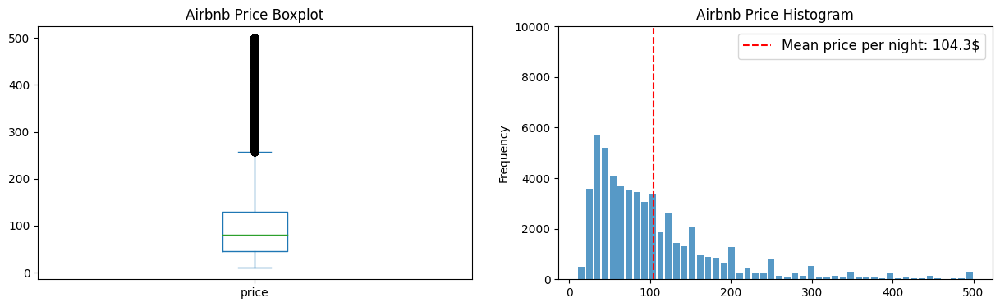

In [13]:
# Boxplot
plt.subplots(1, 2, figsize=(15, 4))
plt.subplot(1, 2, 1)
plt.title("Airbnb Price Boxplot")
df_num.price.plot.box()

# Histogram
plt.subplot(1, 2, 2)
plt.title("Airbnb Price Histogram")
plt.xlabel("Price in US Dollar")
df_num.price.plot.hist(bins=50, alpha=0.75, rwidth = (4/5), label="_nolegend_")
plt.axvline(df_num["price"].mean(), c = "r", ls = "--",
            label=f"Mean price per night: {round(df_num.price.mean(),1)}$")
plt.ylim(0, 10000)
plt.legend(loc = "upper right", fontsize = 12)
plt.show()

Since we observe that the target variable is rightly skewed, we apply log-transformation. This technique is beneficial because it reduces the impact of extreme values, making the distribution more symmetrical which can be seen in the plot below. Thus, it is better suited for various modeling algorithms and can decrease error rates like RMSE.

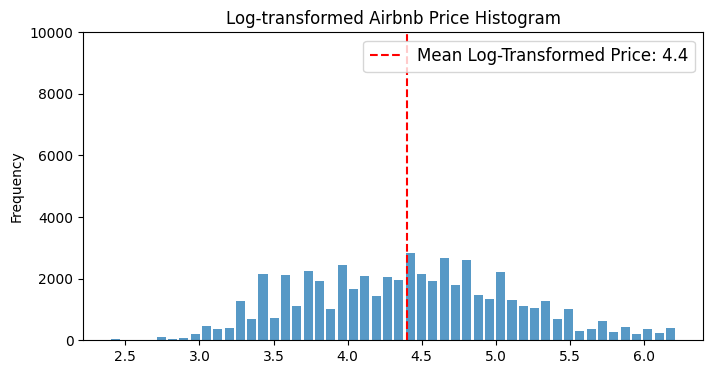

In [14]:
# Log transformation
log_price = np.log1p(df_num["price"])

# Histogram
plt.figure(figsize=(8,4))
plt.title("Log-transformed Airbnb Price Histogram")
plt.xlabel("Log-transformed Price in US Dollar")
log_price.plot.hist(bins=50, alpha=0.75, rwidth=(4/5), label="_nolegend_")
plt.axvline(log_price.mean(), c="r", ls="--", 
            label=f"Mean Log-Transformed Price: {round(log_price.mean(), 2)}")
plt.ylim(0, 10000)
plt.legend(loc="upper right", fontsize=12)
plt.show()

#### 3.1.2 Accommodation Details

In the visual representation below, we compare the distribution of five key features between the training and test datasets. You can see the different distributions and the mean and median values of them. It is evident that:

- The training dataset, being larger, naturally exhibits higher frequencies across the board.
- For the **accommodates** feature, both datasets show a dominant trend: the most common configuration accommodates two people. This similarity suggests consistency in the type of properties listed in both sets.
- Observing the **bathrooms** feature, the primary trend in both datasets is properties with a single bathroom.
- The **bedrooms** distribution shows a clear one bedroom mode for both data sets, with the frequency gradually decreasing as the number of bedrooms increases.
- The **beds** reflect a similar pattern in both datasets, further highlighting the consistency between training and test datasets in terms of property characteristics.
- Lastly, the distribution of **guests_included** is the approximately the same in both sets with most commonly one guest

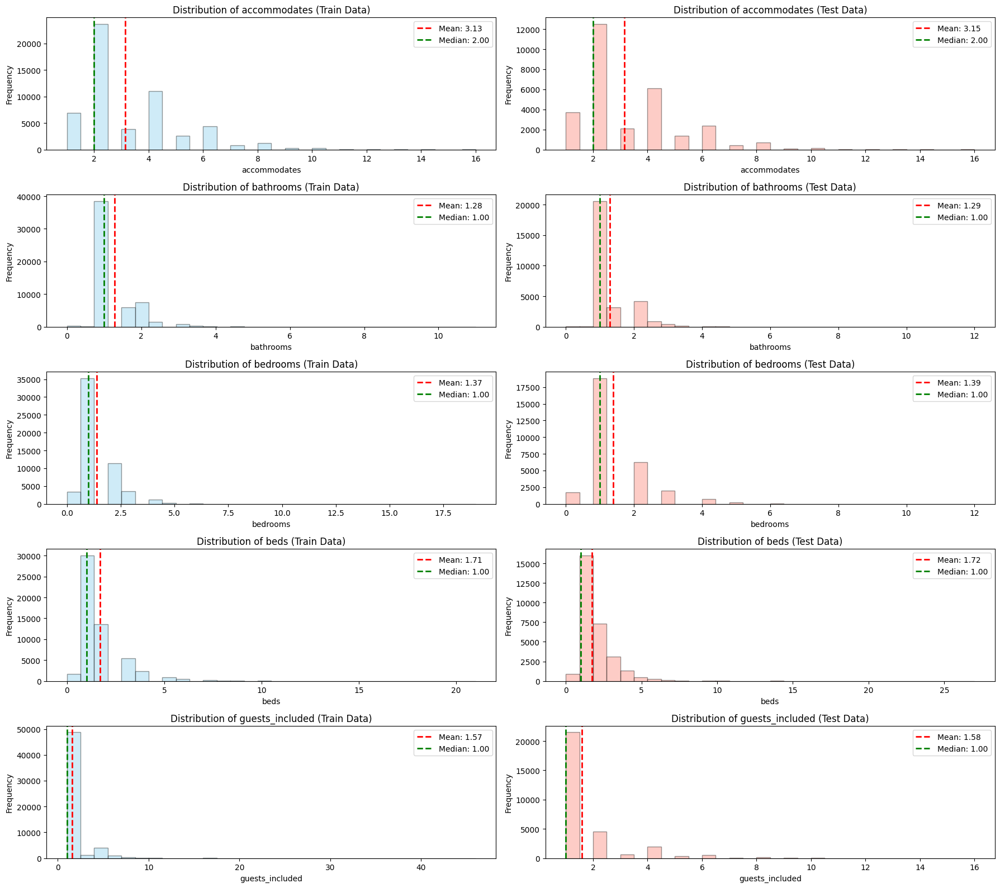

In [15]:
features = ["accommodates", "bathrooms", "bedrooms", "beds", "guests_included"]

fig, axes = plt.subplots(nrows=5, ncols=2, figsize=(18, 16))

for i, feature in enumerate(features):
    # For df_num
    df_feature = df_num[feature].dropna()
    mean_val = df_feature.mean()
    median_val = df_feature.median()

    axes[i, 0].hist(df_feature, bins=30, edgecolor="k", alpha=0.4, color="skyblue")
    axes[i, 0].axvline(mean_val, color="red", linestyle="dashed", linewidth=2, 
                       label=f"Mean: {mean_val:.2f}")
    axes[i, 0].axvline(median_val, color="green", linestyle="dashed", linewidth=2, 
                       label=f"Median: {median_val:.2f}")
    axes[i, 0].set_title(f"Distribution of {feature} (Train Data)")
    axes[i, 0].set_xlabel(feature)
    axes[i, 0].set_ylabel("Frequency")
    axes[i, 0].legend(loc="best")

    # For df_num2
    df_feature2 = df_num2[feature].dropna()
    mean_val2 = df_feature2.mean()
    median_val2 = df_feature2.median()

    axes[i, 1].hist(df_feature2, bins=30, edgecolor="k", alpha=0.4, color="salmon")
    axes[i, 1].axvline(mean_val2, color="red", linestyle="dashed", linewidth=2, 
                       label=f"Mean: {mean_val2:.2f}")
    axes[i, 1].axvline(median_val2, color="green", linestyle="dashed", linewidth=2, 
                       label=f"Median: {median_val2:.2f}")
    axes[i, 1].set_title(f"Distribution of {feature} (Test Data)")
    axes[i, 1].set_xlabel(feature)
    axes[i, 1].set_ylabel("Frequency")
    axes[i, 1].legend(loc="best")

plt.tight_layout()
plt.show()

In the visual representation of the **room_types**, the category "Whole house/App" is most frequently represented in both data sets. This is followed by "private room". Categories such as "hotel room" and "shared room" are hardly represented in both data sets. Also in **bed_types**, the majority of accommodations offer a "real bed". Other bed types such as "pull-out sofa" or "futon" are very rare in comparison.

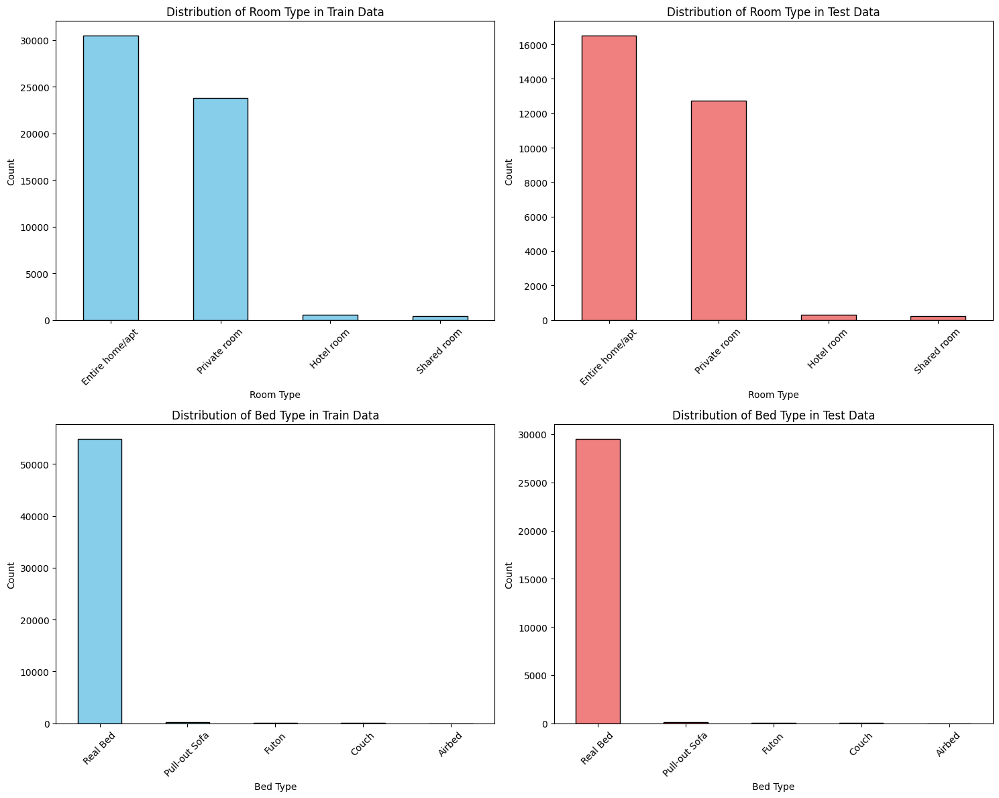

In [16]:
fig, axes = plt.subplots(nrows=2, ncols=2, figsize=(15, 12))  

# Plot for df_num 
df_num["room_type"].value_counts().plot(kind="bar", color="skyblue", edgecolor="black", 
                                        ax=axes[0, 0])
axes[0, 0].set_title("Distribution of Room Type in Train Data")
axes[0, 0].set_xlabel("Room Type")
axes[0, 0].set_ylabel("Count")
axes[0, 0].tick_params(axis="x", rotation=45)

# Plot for df_num2 
df_num2["room_type"].value_counts().plot(kind="bar", color="lightcoral", 
                                         edgecolor="black", ax=axes[0, 1])
axes[0, 1].set_title("Distribution of Room Type in Test Data")
axes[0, 1].set_xlabel("Room Type")
axes[0, 1].set_ylabel("Count")
axes[0, 1].tick_params(axis="x", rotation=45)

# Plot for df_num
df_num["bed_type"].value_counts().plot(kind="bar", color="skyblue", edgecolor="black", 
                                       ax=axes[1, 0])
axes[1, 0].set_title("Distribution of Bed Type in Train Data")
axes[1, 0].set_xlabel("Bed Type")
axes[1, 0].set_ylabel("Count")
axes[1, 0].tick_params(axis="x", rotation=45)

# Plot for df_num2
df_num2["bed_type"].value_counts().plot(kind="bar", color="lightcoral", edgecolor="black", 
                                        ax=axes[1, 1])
axes[1, 1].set_title("Distribution of Bed Type in Test Data")
axes[1, 1].set_xlabel("Bed Type")
axes[1, 1].set_ylabel("Count")
axes[1, 1].tick_params(axis="x", rotation=45)

plt.tight_layout()
plt.show()

The **property_type** distributions in both the training and test datasets are predominantly led by a few common types: "flats" top the list, followed by "houses", "townhouses", "condominiums" and "serviced flats". These categories clearly make up the majority of Airbnb listings.

However, when we look at the less common property types, discrepancies between the training and test datasets become apparent. For example, the training dataset contains listings categorised as "lighthouses" that are notably absent from the test dataset. On the other hand, the test data set contains the category "Minsu (Taiwan)", which is not present in the training data set.

Such inconsistencies create challenges in training and evaluating the model. When our model learns to make predictions based on property types such as "lighthouse", it effectively learns from data that has no predictive value when applied to the test set, especially when categories such as "lighthouse" are not present. On the other hand, our model may not be able to handle "Minsu (Taiwan)" if it was not exposed to it during training.

This can lead to unreliable and uncertain predictions. Therefore, it might be advisable to delete these rare categories during data preprocessing to ensure that the model trains on categories that represent the broader data set and generalise well.

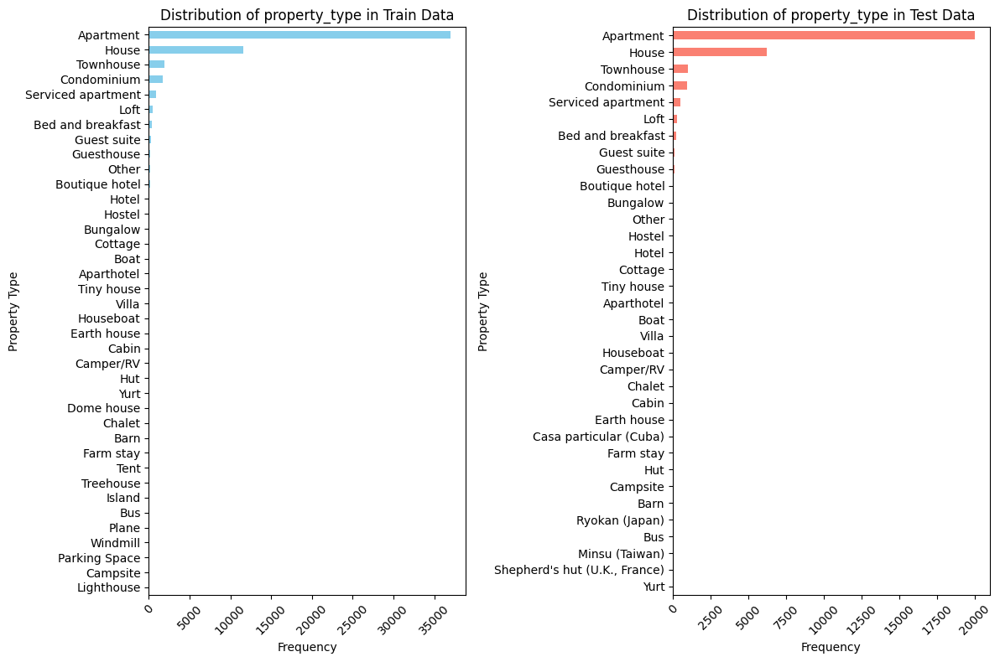

In [17]:
# Temporary df
df_temp_train = df_num.copy()
df_temp_train["dataset"] = "Train"
df_temp_test = df_num2.copy()
df_temp_test["dataset"] = "Test"

combined_df = pd.concat([df_temp_train, df_temp_test], axis=0)

fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(12, 8))

# Plot for Train data
combined_df[combined_df["dataset"] == "Train"]["property_type"].value_counts(dropna=False).sort_values().plot(kind="barh", 
                                                                                                              color="skyblue", 
                                                                                                              ax=axes[0])
axes[0].set_title("Distribution of property_type in Train Data")
axes[0].set_ylabel("Property Type")
axes[0].set_xlabel("Frequency")
axes[0].tick_params(axis="x", rotation=45)

# Plot for Test data
combined_df[combined_df["dataset"] == "Test"]["property_type"].value_counts(dropna=False).sort_values().plot(kind="barh", 
                                                                                                             color="salmon", 
                                                                                                             ax=axes[1])
axes[1].set_title("Distribution of property_type in Test Data")
axes[1].set_ylabel("Property Type")
axes[1].set_xlabel("Frequency")
axes[1].tick_params(axis="x", rotation=45)

plt.tight_layout()
plt.show()

For the listings in our dataset, when we analyze the **experiences_offered** feature, it becomes evident that the vast majority offer "none" as an experience. Any other types of experiences are considerably rare and do not appear frequently. On the other hand, when examining the **cancellation_policy**, we observe that the most prevalent policy is "strict_14_with_grace_period". This is closely followed by "flexible" and "moderate", indicating a diversity in hosts preferences for cancellation terms. In both features train and test set have similar frequencies.

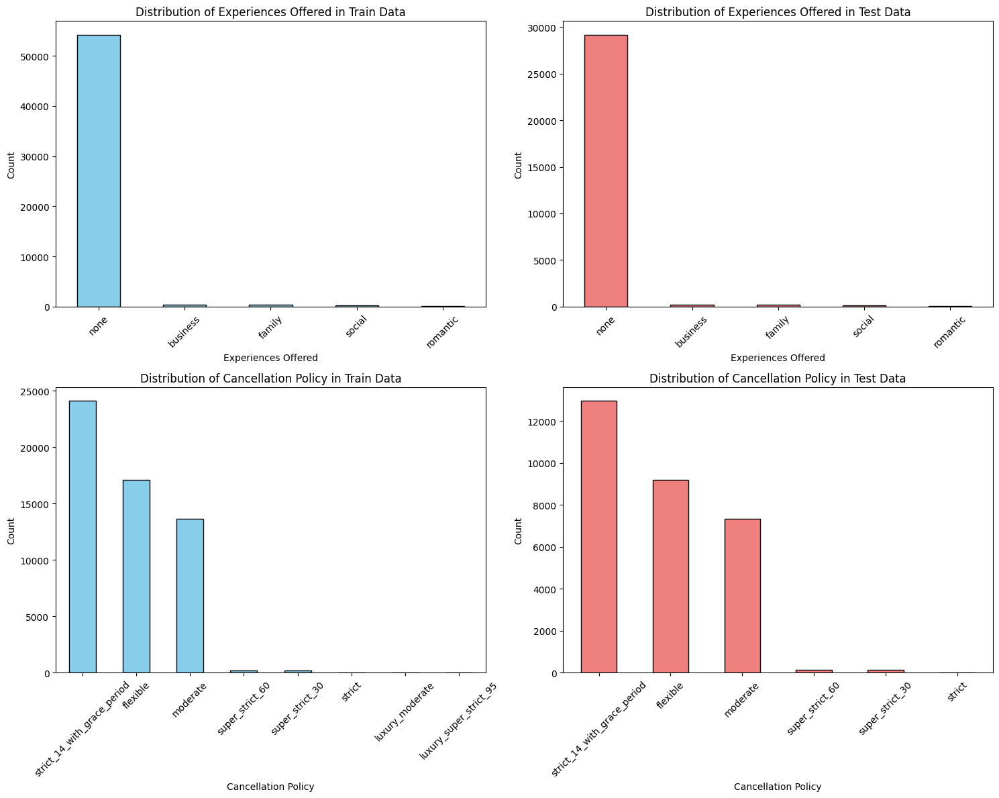

In [18]:
fig, axes = plt.subplots(nrows=2, ncols=2, figsize=(15, 12))

# Plot for df_num
df_num["experiences_offered"].value_counts().plot(kind="bar", color="skyblue", 
                                                  edgecolor="black", ax=axes[0, 0])
axes[0, 0].set_title("Distribution of Experiences Offered in Train Data")
axes[0, 0].set_xlabel("Experiences Offered")
axes[0, 0].set_ylabel("Count")
axes[0, 0].tick_params(axis="x", rotation=45)

# Plot for df_num2 
df_num2["experiences_offered"].value_counts().plot(kind="bar", 
                                                   color="lightcoral", 
                                                   edgecolor="black", ax=axes[0, 1])
axes[0, 1].set_title("Distribution of Experiences Offered in Test Data")
axes[0, 1].set_xlabel("Experiences Offered")
axes[0, 1].set_ylabel("Count")
axes[0, 1].tick_params(axis="x", rotation=45)

# Plot for df_num 
df_num["cancellation_policy"].value_counts().plot(kind="bar", 
                                                  color="skyblue", 
                                                  edgecolor="black", ax=axes[1, 0])
axes[1, 0].set_title("Distribution of Cancellation Policy in Train Data")
axes[1, 0].set_xlabel("Cancellation Policy")
axes[1, 0].set_ylabel("Count")
axes[1, 0].tick_params(axis="x", rotation=45)

# Plot for df_num2 
df_num2["cancellation_policy"].value_counts().plot(kind="bar", color="lightcoral", 
                                                   edgecolor="black", ax=axes[1, 1])
axes[1, 1].set_title("Distribution of Cancellation Policy in Test Data")
axes[1, 1].set_xlabel("Cancellation Policy")
axes[1, 1].set_ylabel("Count")
axes[1, 1].tick_params(axis="x", rotation=45)

plt.tight_layout()
plt.show()

#### 3.1.3 Review Scores

The histograms show the distribution of evaluation scores across different criteria such as check-in, cleanliness, communication, etc. It is notable that both the training and test datasets have close mean and median scores, reflecting a consistent distribution of data - a favourable scenario as this ensures that our models trained on the training set also fit the test set.

Most of the scores are left-skewed, suggesting that a significant number of Airbnb listings received high scores, with the peak score consistently at 10. This suggests that guests are generally satisfied with their stays. The exception is the "ratings per month" feature, which is right skewed; on average, listings receive about 1.16 ratings per month.

Furthermore, in almost all cases, the mean and median are close to each other, suggesting that there are no extreme values or outliers that could strongly skew the average. This closeness indicates a relatively symmetrical distribution around the central value.

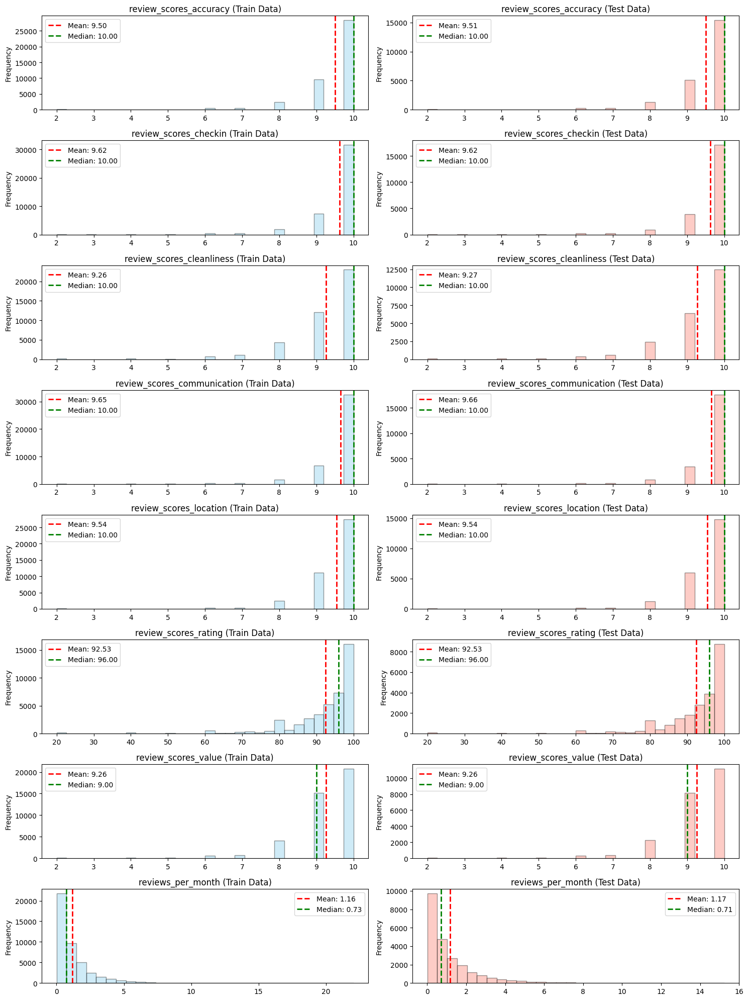

In [19]:
# List of the review related features
features = [
    "review_scores_accuracy", "review_scores_checkin", "review_scores_cleanliness",
    "review_scores_communication", "review_scores_location", "review_scores_rating",
    "review_scores_value", "reviews_per_month"
]

fig, axes = plt.subplots(nrows=8, ncols=2, figsize=(15, 20))

for i, feature in enumerate(features):
    # Plot for df_num
    df_feature = df_num[feature].dropna()
    mean_val = df_feature.mean()
    median_val = df_feature.median()

    axes[i, 0].hist(df_feature, bins=30, edgecolor="k", alpha=0.4, color="skyblue")
    axes[i, 0].axvline(mean_val, color="red", linestyle="dashed", linewidth=2, 
                       label=f"Mean: {mean_val:.2f}")
    axes[i, 0].axvline(median_val, color="green", linestyle="dashed", linewidth=2, 
                       label=f"Median: {median_val:.2f}")

    axes[i, 0].set_title(f"{feature} (Train Data)")
    axes[i, 0].legend(loc="best")
    axes[i, 0].set_ylabel("Frequency")

    # Plot for df_num2
    df_feature2 = df_num2[feature].dropna()
    mean_val2 = df_feature2.mean()
    median_val2 = df_feature2.median()

    axes[i, 1].hist(df_feature2, bins=30, edgecolor="k", alpha=0.4, color="salmon")
    axes[i, 1].axvline(mean_val2, color="red", linestyle="dashed", linewidth=2, 
                       label=f"Mean: {mean_val2:.2f}")
    axes[i, 1].axvline(median_val2, color="green", linestyle="dashed", linewidth=2, 
                       label=f"Median: {median_val2:.2f}")

    axes[i, 1].set_title(f"{feature} (Test Data)")
    axes[i, 1].legend(loc="best")
    axes[i, 1].set_ylabel("Frequency")

plt.tight_layout()
plt.show()

#### 3.1.4 Host Details

Analysing the host information, we need to do a bit of data preprocessing already, since we need to transform the variables "host_repsonse_rate" and "host_since" to numeric values.

We transformed the "host_since" column, which originally contained the date when the host joined, into a new column called "days_since_host". This was achieved by subtracting each hosts join date from the latest "host_since" date in our data. As a result, "days_since_host" represents the number of days the host has been on the platform up to the most recent date in our datasets.

In [20]:
# Convert host_since to datetime format
df_num["host_since"] = pd.to_datetime(df_num["host_since"], errors="coerce", format="%Y-%m-%d")
df_num2["host_since"] = pd.to_datetime(df_num2["host_since"], errors="coerce", format="%Y-%m-%d")

# Determine the latest host_since date from both training and test data as cut off date
cutoff_date = max(df_num["host_since"].max(), df_num2["host_since"].max())

In [21]:
def preprocess_columns(df):
    # Remove % signs
    df["host_response_rate"] = df["host_response_rate"].str.replace("%", "").astype(float)/100

    # Convert host_since to datetime format
    df["host_since"] = pd.to_datetime(df["host_since"], format="%Y-%m-%d")

    # Calculate days since host
    df["days_since_host"] = (cutoff_date - df["host_since"]).dt.days

    # Drop host_since
    df.drop("host_since", axis=1, inplace=True)

    return df

In [22]:
# Apply function
df_num = preprocess_columns(df_num)
df_num2 = preprocess_columns(df_num2)

Upon analyzing the host-related features, **host_response_rate**, **days_since_host**, and **host_total_listings_count**, we find consistent distributions between the training and testing sets.

Most hosts have a response rate of 100%, but the average is 93%. This shows that while most hosts respond very quickly, a small proportion do not respond as quickly.

Considering the **days_since_host** feature, the average host has been on the platform for about 1500 days, which translates to just over 4 years. This duration offers insight into a hosts experience on the platform. The right-skewed distribution suggests the platform continues to attract newer hosts more than losing older ones. The proximity of the mean to the median supports this observation.

For **host_total_listings_count**, the median shows a typical host manages approximately 2 listings. However, the mean, at around 21, reflects the influence of outliers. There are a few hosts with an unusually high number of listings, sometimes exceeding 1200. These outliers have a significant influence on the mean value.

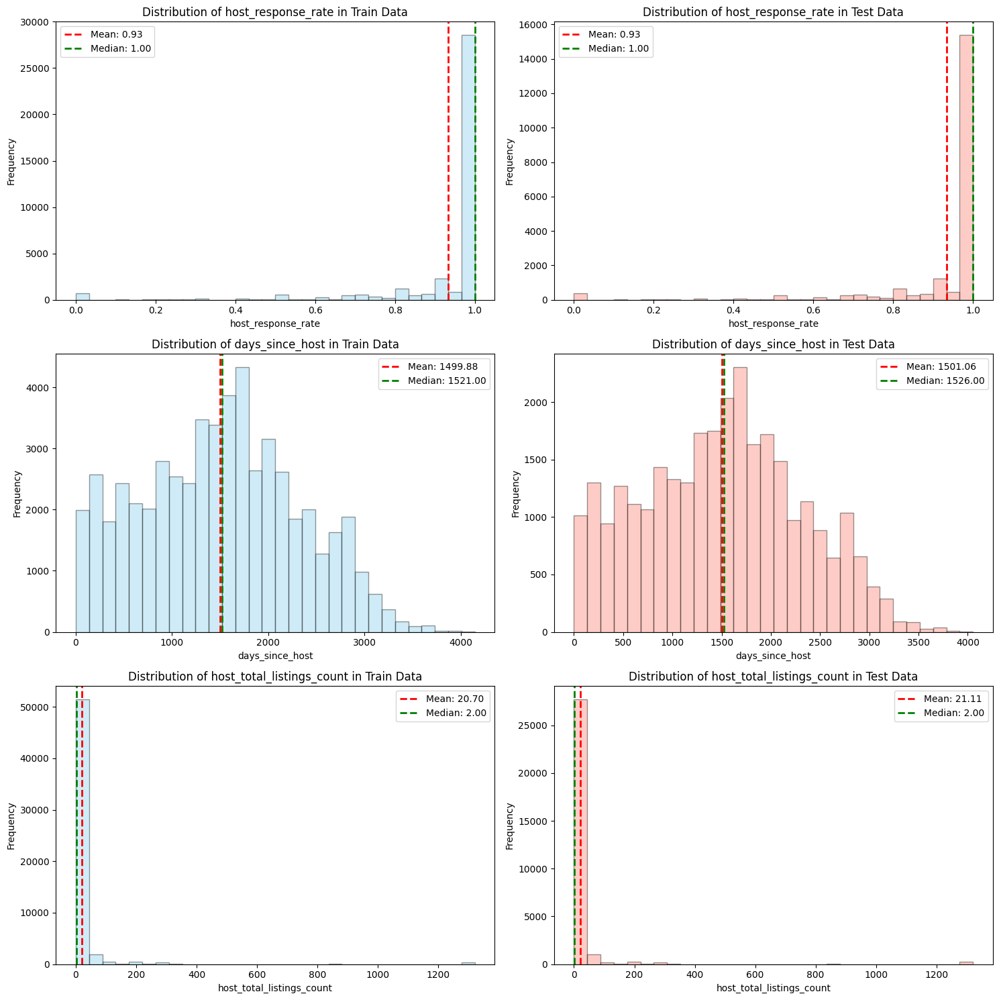

In [23]:
features = ["host_response_rate", "days_since_host", "host_total_listings_count"]

fig, axes = plt.subplots(nrows=3, ncols=2, figsize=(15, 15))

for i, feature in enumerate(features):

    # Plot for Train data
    df_feature_train = df_num[feature].dropna()
    mean_val_train = df_feature_train.mean()
    median_val_train = df_feature_train.median()

    df_feature_train.hist(bins=30, edgecolor="k", alpha=0.4, ax=axes[i, 0], color="skyblue")
    axes[i, 0].axvline(mean_val_train, color="red", linestyle="dashed", linewidth=2, 
                       label=f"Mean: {mean_val_train:.2f}")
    axes[i, 0].axvline(median_val_train, color="green", linestyle="dashed", 
                       linewidth=2, label=f"Median: {median_val_train:.2f}")

    axes[i, 0].set_title(f"Distribution of {feature} in Train Data")
    axes[i, 0].set_xlabel(feature)
    axes[i, 0].set_ylabel("Frequency")
    axes[i, 0].grid(False)
    axes[i, 0].legend(loc="best")

    # Plot for Test data
    df_feature_test = df_num2[feature].dropna()
    mean_val_test = df_feature_test.mean()
    median_val_test = df_feature_test.median()

    df_feature_test.hist(bins=30, edgecolor="k", alpha=0.4, ax=axes[i, 1], color="salmon")
    axes[i, 1].axvline(mean_val_test, color="red", linestyle="dashed", 
                       linewidth=2, label=f"Mean: {mean_val_test:.2f}")
    axes[i, 1].axvline(median_val_test, color="green", linestyle="dashed", 
                       linewidth=2, label=f"Median: {median_val_test:.2f}")

    axes[i, 1].set_title(f"Distribution of {feature} in Test Data")
    axes[i, 1].set_xlabel(feature)
    axes[i, 1].set_ylabel("Frequency")
    axes[i, 1].grid(False)
    axes[i, 1].legend(loc="best")

plt.tight_layout()
plt.show()

In the provided datasets, columns such as **host_has_profile_pic**, **host_identity_verified**, and **host_is_superhost** were transformed from string representations ('t' and 'f') to binary (1 and 0), with the column names updated for clarity by appending _True.

In [24]:
# Encoding and renaming function
def transform_and_rename(df, cols):
    for col in cols:
        # Mapping 't' and 'f' to 1 and 0
        df[col] = df[col].map({"t": 1, "f": 0})
        # Renaming the columns to append "_True"
        df.rename(columns={col: col + "_True"}, inplace=True)
    return df

In [25]:
# List of columns to be transformed
cols = ["host_has_profile_pic", "host_identity_verified", "host_is_superhost"]

# Applying function
df_num = transform_and_rename(df_num, cols)
df_num2 = transform_and_rename(df_num2, cols)

When looking at further information on the hosts, it becomes clear that almost every host on the platform has uploaded a profile picture. This underlines the role of a visual introduction in building trust and improving the attractiveness of the offers. In terms of identity verification, a larger number of hosts have chosen not to verify their identity, which can lead to trust issues for security-conscious guests. While the majority of hosts operate at a basic level, a significant minority have earned the "superhost" badge. Given its relative rarity, this badge is a proof of outstanding service and trustworthiness.

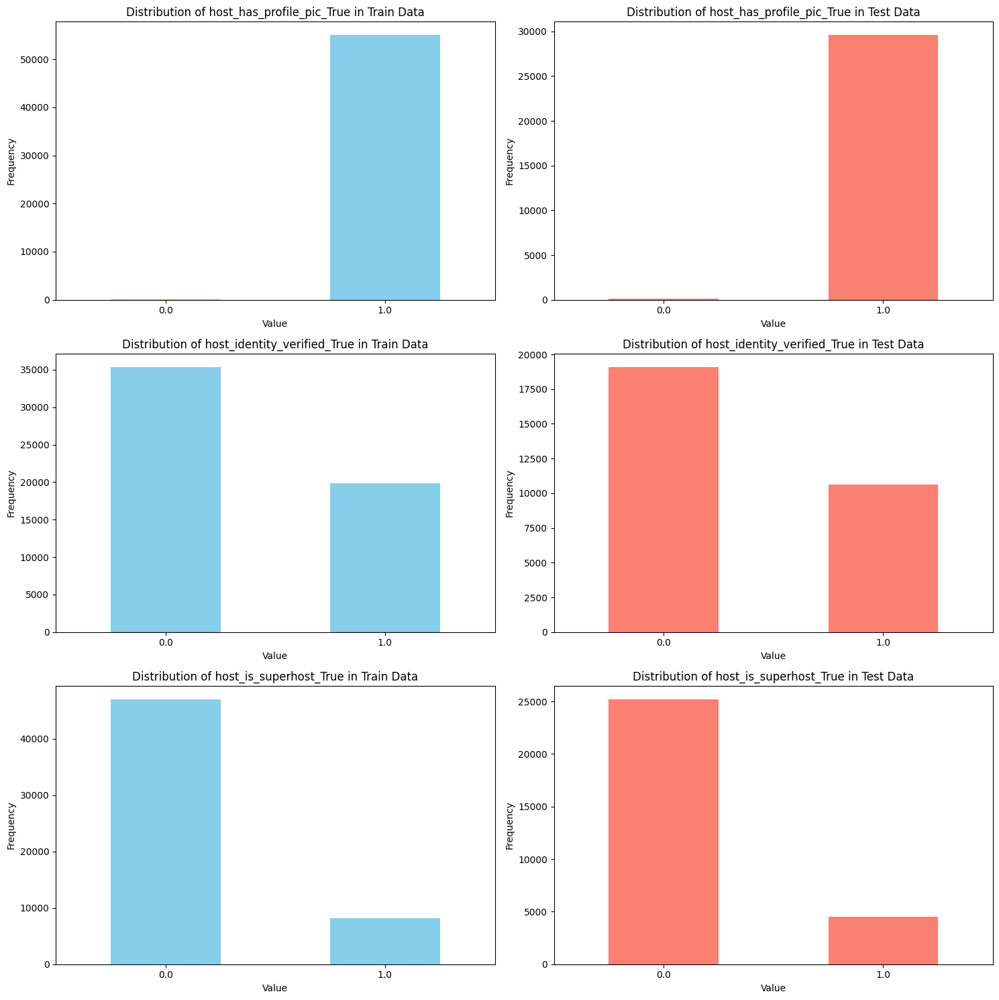

In [26]:
# List of columns to plot
columns_to_plot = ["host_has_profile_pic_True", "host_identity_verified_True", "host_is_superhost_True"]

fig, axes = plt.subplots(nrows=3, ncols=2, figsize=(15, 15))

for i, column in enumerate(columns_to_plot):

    # Plot for Train data
    df_num[column].value_counts().sort_index().plot(kind="bar", color="skyblue", ax=axes[i, 0])
    axes[i, 0].set_title(f"Distribution of {column} in Train Data")
    axes[i, 0].set_xlabel("Value")
    axes[i, 0].set_ylabel("Frequency")
    axes[i, 0].grid(False)
    axes[i, 0].tick_params(axis="x", rotation=0)

    # Plot for Test data
    df_num2[column].value_counts().sort_index().plot(kind="bar", color="salmon", ax=axes[i, 1])
    axes[i, 1].set_title(f"Distribution of {column} in Test Data")
    axes[i, 1].set_xlabel("Value")
    axes[i, 1].set_ylabel("Frequency")
    axes[i, 1].grid(False)
    axes[i, 1].tick_params(axis="x", rotation=0)

plt.tight_layout()
plt.show()

#### 3.1.5 Density Maps

To ensure the consistency and reliability of our model's predictions, we have visualized the geographical distribution of listings for both the training and test datasets. A close inspection of these visualizations reveals a high similarity in the density patterns of both datasets. Particularly, there is a pronounced density in the center of the city as compared to the outer boroughs. This alignment in spatial distribution ensures that our model is trained and tested on data with matching geographical characteristics.

In [27]:
# Maps df for train set
maps_train = df_num[["latitude", "longitude"]].copy()

# Maps df for test set
maps_test = df_num2[["latitude", "longitude"]].copy()

# Density heatmap train set
fig_train = px.density_mapbox(maps_train,
                              lat="latitude",
                              lon="longitude",
                              radius=2,
                              zoom=9,
                              mapbox_style="stamen-terrain",
                              title="Density of Airbnb Locations in Train Set")
fig_train.show()

# Density heatmap test set
fig_test = px.density_mapbox(maps_test,
                             lat="latitude",
                             lon="longitude",
                             radius=2,
                             zoom=9,
                             mapbox_style="stamen-terrain",
                             title="Density of Airbnb Locations in Test Set")
fig_test.show()

Additionally, the Airbnb listings are presented with a color gradient that ranges from dark blue to red, symbolizing the spectrum of prices. A majority of listings display shades from dark to light blue, denoting mid-range to moderately priced accommodations. In the outer boroughs, the dominance of dark blue markers indicates more budget-friendly options. Central London, on the other hand, is dotted with lighter colours and some red markings, indicating high pricing in these areas.

In [28]:
# Maps df
maps = df_num[["latitude", "longitude"]].copy()
maps["price"] = df_num["price"]

# Plot
fig = px.scatter_mapbox(maps,
                        lat="latitude",
                        lon="longitude",
                        color="price",
                        color_continuous_scale=px.colors.cyclical.IceFire,
                        size_max=15,
                        zoom=10,
                        mapbox_style="carto-positron",
                        title = "Airbnb Price Locations")
fig.show()

#### 3.1.6 Correlation Matrix

In the final step of the numerical EDA, we run a correlation matrix to identify and understand the linear relationships between different property attributes and their impact on price. By examining these correlations, we aim to find out which attributes have the strongest impact on property price.

Here are the key findings:

**Highly Positive Correlation with Price**
- Properties with greater accommodation capacity, such as more bedrooms and beds, tend to have higher prices. Specifically, there is a positive correlation between price and the number of people a property can accommodate (0.589), the number of bedrooms (0.512), and the number of beds (0.470). Essentially, larger properties designed for more guests generally demand a higher price.

**Notable Correlation with Price**
- Listings that accommodate more guests within the base price typically command higher rates. Specifically, there is a notable correlation between price and the number of guests included (0.323). This makes sense as more guests would generally require more space, leading to larger and, consequently, pricier Airbnb listings. Moreover, the importance of a propertys location is underscored with a correlation of (0.210), suggesting that properties with superior location scores consistently attract higher prices. Superhosts usually list their properties at slightly elevated prices, a trend evidenced by a correlation value of (0.156). This could be attributed to the premium service, unique property features, or exclusive amenities these hosts offer.

**Negative Correlation with Price**
- The data does not show any strong negative correlations between price and the other features based on the given correlations.

From these correlations, it is clear that the size and capacity of the property (e.g., how many it can accommodate, the number of bedrooms and beds) play a significant role in determining the price. Other factors, like the quality of the location and the hosts status, can also influence the price to a certain extent.

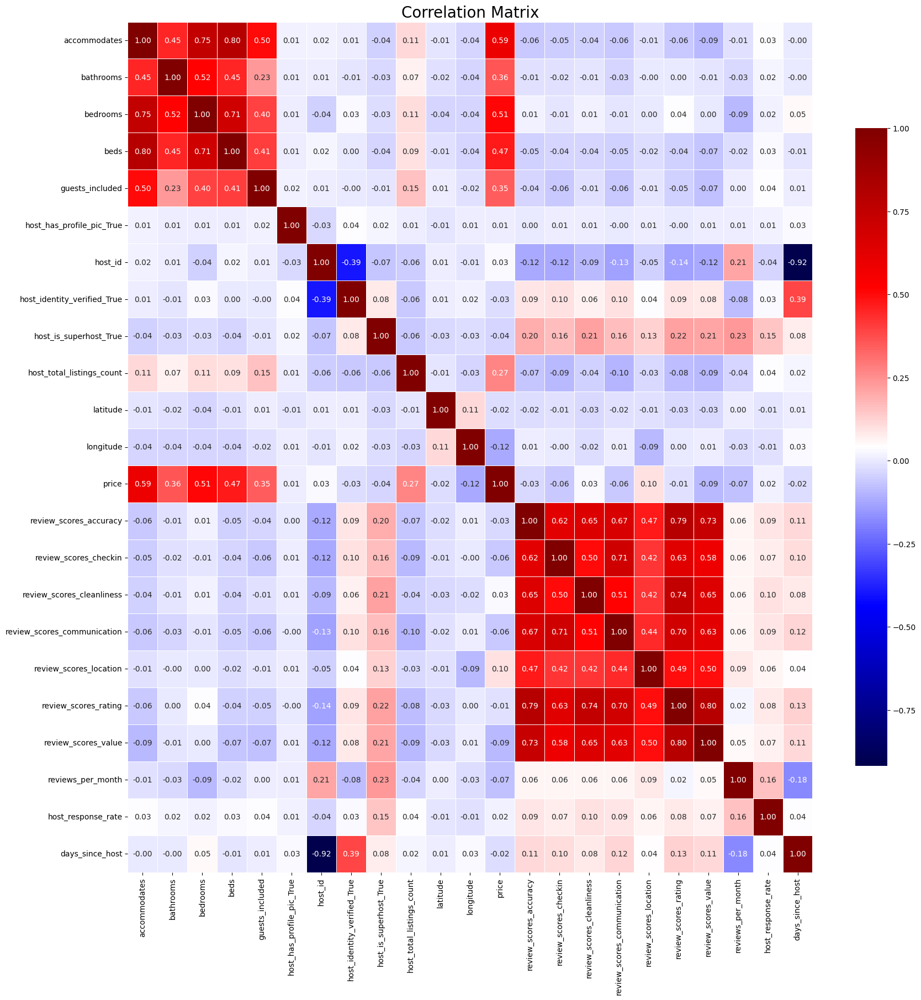

In [29]:
# Correlation matrix
corr_matrix = df_num.corr(numeric_only=True)

# Heatmap
plt.figure(figsize = (20, 20))
sns.heatmap(corr_matrix, annot=True, fmt=".2f", cmap="seismic", linewidths=.5, 
            cbar_kws={"shrink": 0.75})
plt.title("Correlation Matrix", fontsize=20)
plt.xticks(fontsize=10)
plt.yticks(fontsize=10)
plt.show()

Concluding, we can say that in most cases, the training data aligns very well with the test data in terms of their distributions. This allows us to anticipate a robust predictive power of the numeric data for price prediction. Our EDA has revealed significant correlations between the price and certain features, which should be considered in model building.

### 3.2. Numeric Data Preprocessing

Data preprocessing is an important part of the data science pipeline. By refining and optimising our datasets, we increase the potential for accurate and meaningful forecasts.

First, we drop the "neighbourhood" and "postcode" columns in favour of "neighbourhood_cleansed" to simplify our dataset and reduce dimensionality without sacrificing broader geographic context. In combination with the latitude and longitude data, we ensure granularity and reduce the potential for overfitting the model. In addition, "host_id" is removed as it is a unique identifier for hosts that is not informative for our analysis.

In [30]:
# Drop columns
df_num = df_num.drop(columns=["neighbourhood", "zipcode", "host_id"])
df_num2 = df_num2.drop(columns=["neighbourhood", "zipcode", "host_id"])

Second, we check missing values in the datasets.

**Numeric Imputation**

*Host-related variables*
- Our analysis revealed a curious pattern in columns such as "host_has_profile_pic_True", "host_identity_verified_True" and other host-related attributes. These columns all had the same number of missing rows, 111 in total. A closer look showed that these missing rows were the same for all variables. This could be due to omissions in data collection or data entry related to host-specific information. As these represent only a tiny part of our data, we decide to remove them.

*Variables with less than 20% missing data*.
- For columns with less than 20% missing entries, our strategy is to use the mean for imputation. This decision goes back to our EDA, where the mean and median were close for most variables. It is important to note that while the median often reflects the mode, the mean provides an element of variability that ensures a more nuanced representation of the data. It is significant that these variables are primarily associated with accommodation specifics such as the number of bathrooms, bedrooms and the like.

*Variables with over 20% missing data*.
- A number of characteristics, indicated by their orange marker, have registered missing values exceeding the 20% threshold. High rates of missing data require a careful approach, especially as simple imputations using mean or median could distort the actual data distribution. To counteract this, our plan of action is to use the mean for imputation, supplemented by an auxiliary column that marks the missing values. This combined method facilitates the completion of the missing values and at the same time provides information about potential missing patterns.

*Categorical imputation**
- For the variable "host_response_time", the only categorical column that has a missing rate above 20%, we distinguish four response times: "within an hour", "within a few hours", "within a day" and "a few days or longer". To account for missing entries, we will code NaN values as "missing", which introduces a separate category for this attribute. This step ensures that the information associated with the absence of the attribute is not ignored.
- Finally, there are no categorical variables in our dataset with less than 20% missing data.

In [31]:
# Function for highlighting background in orange if greater 0.2
def highlight_orange(s):
    color = "background-color: orange" if s["df1_relative_miss"] > 0.2 else ""
    return [color] * len(s)

def compare_miss_values(df1, df2):
    # Calculate missing values and data types for both dataframes
    miss_df1 = df1.isna().sum()
    miss_df2 = df2.isna().sum()

    relative_miss_df1 = (df1.isna().sum() / len(df1))
    relative_miss_df2 = (df2.isna().sum() / len(df2))

    dtype_df1 = df1.dtypes
    dtype_df2 = df2.dtypes

    comparison_df = pd.concat([miss_df1, relative_miss_df1, dtype_df1,
                               miss_df2, relative_miss_df2, dtype_df2], axis=1)

    comparison_df.columns = ["df1_miss", "df1_relative_miss", "df1_dtype",
                             "df2_miss", "df2_relative_miss", "df2_dtype"]

    styled_df = comparison_df.style.apply(highlight_orange, axis=1)

    return styled_df

In [32]:
# Apply compare missing values function
comparison = compare_miss_values(df_num, df_num2)
comparison

,df1_miss,df1_relative_miss,df1_dtype,df2_miss,df2_relative_miss,df2_dtype
accommodates,0,0.000000,int64,0.000000,0.000000,int64
bathrooms,70,0.001266,float64,50.000000,0.001680,float64
bed_type,0,0.000000,object,0.000000,0.000000,object
bedrooms,62,0.001121,float64,29.000000,0.000974,float64
beds,262,0.004739,float64,142.000000,0.004770,float64
cancellation_policy,0,0.000000,object,0.000000,0.000000,object
experiences_offered,0,0.000000,object,0.000000,0.000000,object
guests_included,0,0.000000,int64,0.000000,0.000000,int64
host_has_profile_pic_True,111,0.002008,float64,65.000000,0.002183,float64
host_identity_verified_True,111,0.002008,float64,65.000000,0.002183,float64


In [33]:
def check_missing_rows(df, columns):
    # Get rows with missing values
    missing_rows = df[df[columns[0]].isnull()].index

    # For every other column, check if the missing rows are the same
    for col in columns[1:]:
        if not set(missing_rows) == set(df[df[col].isnull()].index):
            return False  # If any mismatch, return False
    return True

In [34]:
# Apply function
df_columns_to_check = [
    "host_has_profile_pic_True",
    "host_identity_verified_True",
    "host_is_superhost_True",
    "host_total_listings_count",
    "days_since_host"
]

result = check_missing_rows(df_num, df_columns_to_check)
result2 = check_missing_rows(df_num2, df_columns_to_check)

print(f"In train set the features have missing values in the same rows: {result}")
print(f"In test set the features have missing values in the same rows: {result}")

In train set the features have missing values in the same rows: True
In test set the features have missing values in the same rows: True


Hence, we impute the binary features "host_is_superhost_True", "host_identity_verified_True", "host_has_profile_pic_True" with the mode and the numeric features  "host_total_listings_count" and "days_since_host" with the mean. 

In [35]:
# For df_num
mean_values_num = df_num[["host_total_listings_count", "days_since_host"]].mean()
df_num[["host_total_listings_count", "days_since_host"]] = df_num[["host_total_listings_count", "days_since_host"]].fillna(mean_values_num)

# For df_num2
mean_values_num2 = df_num2[["host_total_listings_count", "days_since_host"]].mean()
df_num2[["host_total_listings_count", "days_since_host"]] = df_num2[["host_total_listings_count", "days_since_host"]].fillna(mean_values_num2)

# Step 2: Replacing missing values with the mode
cols_to_mode = ["host_is_superhost_True", "host_identity_verified_True", "host_has_profile_pic_True"]

# For df_num
mode_values_num = df_num[cols_to_mode].mode().iloc[0]
df_num[cols_to_mode] = df_num[cols_to_mode].fillna(mode_values_num)

# For df_num2
mode_values_num2 = df_num2[cols_to_mode].mode().iloc[0]
df_num2[cols_to_mode] = df_num2[cols_to_mode].fillna(mode_values_num2)

In [36]:
def missing_values(df):
    # Numeric columns
    numerical_cols = df.select_dtypes(include=["int64", "float64"]).columns

    for col in numerical_cols:
        missing_rate = df[col].isnull().sum() / len(df)

        # If missing rate is less than 20%, impute with mean
        if missing_rate < 0.2:
            df[col].fillna(df[col].mean(), inplace=True)

        # If missing rate is greater than 20%, add auxiliary column
        else:
            df[col + "_missing_ind"] = df[col].isnull().astype(int)
            df[col].fillna(df[col].mean(), inplace=True)

    # Categorical columns
    categorical_cols = df.select_dtypes(include="object").columns

    for col in categorical_cols:
        df[col] = df[col].fillna("Missing")

    return df

In [37]:
# Apply function
df_num = missing_values(df_num)
df_num2 = missing_values(df_num2)

By doing this, we have no missing values anymore in our data.

In [38]:
# Apply function
comparison = compare_miss_values(df_num, df_num2)
comparison

,df1_miss,df1_relative_miss,df1_dtype,df2_miss,df2_relative_miss,df2_dtype
accommodates,0,0.000000,int64,0.000000,0.000000,int64
bathrooms,0,0.000000,float64,0.000000,0.000000,float64
bed_type,0,0.000000,object,0.000000,0.000000,object
bedrooms,0,0.000000,float64,0.000000,0.000000,float64
beds,0,0.000000,float64,0.000000,0.000000,float64
cancellation_policy,0,0.000000,object,0.000000,0.000000,object
experiences_offered,0,0.000000,object,0.000000,0.000000,object
guests_included,0,0.000000,int64,0.000000,0.000000,int64
host_has_profile_pic_True,0,0.000000,float64,0.000000,0.000000,float64
host_identity_verified_True,0,0.000000,float64,0.000000,0.000000,float64


Third, when preparing data for analysis or modeling, it is essential to ensure that our dataset is robust and interpretable. Small categories within features can introduce noise and can lead to overfitting in machine learning models. By setting a threshold for category frequencies, we are achieving two main goals:

- **Ensures Statistical Robustness**: Grouping very small categories prevents potential overfitting when the data is used for modeling. This ensures that each category within our features has sufficient samples to make statistical inferences.

- **Balances Simplicity and Information**: While it is crucial to retain the granularity of data, it is equally important to avoid excessive complexity. By aggregating the rarer categories, we reduce dimensionality and make the data more interpretable, without oversimplifying it.

In our case, we have chosen a percentage-based threshold (1%) to determine which categories are deemed "small". This approach helps in dynamically adjusting the threshold based on the size of the dataset.

In [39]:
def consolidate_categories(df, threshold_percentage=0.01):
    threshold = len(df) * threshold_percentage
    object_cols = df.select_dtypes(include=["object"]).columns

    for col in object_cols:
        value_counts = df[col].value_counts()
        small_categories = value_counts[value_counts <= threshold].index
        df[col] = df[col].apply(lambda x: "Other" if x in small_categories else x)

    return df

In [40]:
# Apply function
df_num = consolidate_categories(df_num)
df_num2 = consolidate_categories(df_num2)

Fourth, it is essential to convert categorical data into a format that can be provided to machine learning algorithms to improve model performance. To this end:

- **Binary Columns**: We map columns with just two categories to 0s and 1s. Notably, the majority class is designated as 1 to provide intuitive binary representation. The resultant column is named after the majority category for clarity.

- **Non-binary Columns**: For columns with more than two categories, we employ one-hot encoding. This creates distinct columns for each category and represents the presence of the category with 1 or 0.

Utilizing such dummy variable transformations allows models to quantify and better understand the categorical data, enabling more accurate predictions. It also eliminates potential misleading interpretations a model might derive from treating ordinal numbers in categorical data as quantitative.

In [41]:
def dummy_transformation(df):

    # Category data
    for col in df.columns:

        if df[col].dtype == "object":

            # Binary category
            if df[col].nunique() == 2:
                # Finding majority category
                majority_category = df[col].value_counts().idxmax()
                minority_category = df[col].value_counts().idxmin()
                mapping_dict = {majority_category: 1, minority_category: 0}

                df[col] = df[col].map(mapping_dict)
                # Renaming column
                df = df.rename(columns={col: col + "_" + majority_category})

            # One hot encoding for non binary columns
            elif df[col].nunique() > 2:
                dummies = pd.get_dummies(df[col], prefix=col, drop_first=True)
                df = pd.concat([df, dummies], axis=1)
                df = df.drop(columns=[col])

    return df

In [42]:
# Apply function
df_num = dummy_transformation(df_num)
df_num2 = dummy_transformation(df_num2)

The training data consists of 69 variables, which is coherent with the testing data that has 68 variables; the additional variable in the training data is the target variable, **price**.

In [43]:
print(f"Training data variables: {df_num.shape[1]}")
print(f"Testing data variables: {df_num2.shape[1]}")

Training data variables: 69
Testing data variables: 68


For our modeling process to proceed smoothly, it is essential to ensure that our training and testing datasets have consistent features. After checking, we observe that the 'price' variable is present in the training dataset but absent from the testing set, which is expected since 'price' is our target variable for prediction. So everything is as it should be!

In [44]:
def check_variable_consistency(train_df, test_df):
    train_columns = set(train_df.columns)
    test_columns = set(test_df.columns)

    train_not_test = train_columns - test_columns
    test_not_train = test_columns - train_columns

    if not train_not_test and not test_not_train:
        return "Both datasets have the same variables."
    else:
        return {
            "In train but not in test": list(train_not_test),
            "In test but not in train": list(test_not_train)
        }

In [45]:
check_variable_consistency(df_num, df_num2)

{'In train but not in test': ['price'], 'In test but not in train': []}

In our final preprocessing step for numerical data, we adjust the target variable, price, by taking its logarithm. This transformation, inspired by our initial exploratory data analysis, helps to achieve a more symmetric distribution. 

We standardize using the training set to avoid data leakage from the test set. This ensures that our model evaluates on data processed in the same manner as the training data.

In [46]:
# Separating the target variable and taking log
y = df_num["price"]
y_log = np.log(y)
df_num.drop("price", axis=1, inplace=True)

In [47]:
# Scaling
scaler = StandardScaler()

# Fit the scaler to train data
scaler.fit(df_num)

# Scale based on train data 
df_num_scaled = pd.DataFrame(scaler.transform(df_num), columns=df_num.columns)
df_num2_scaled = pd.DataFrame(scaler.transform(df_num2), columns=df_num2.columns)

In [48]:
df_num_scaled.describe()

,accommodates,bathrooms,bed_type_Real Bed,bedrooms,beds,experiences_offered_none,guests_included,host_has_profile_pic_True,host_identity_verified_True,host_is_superhost_True,...,neighbourhood_cleansed_Southwark,neighbourhood_cleansed_Tower Hamlets,neighbourhood_cleansed_Waltham Forest,neighbourhood_cleansed_Wandsworth,neighbourhood_cleansed_Westminster,property_type_Condominium,property_type_House,property_type_Other,property_type_Serviced apartment,property_type_Townhouse
count,5.528400e+04,5.528400e+04,5.528400e+04,5.528400e+04,5.528400e+04,5.528400e+04,5.528400e+04,5.528400e+04,5.528400e+04,5.528400e+04,...,5.528400e+04,5.528400e+04,5.528400e+04,5.528400e+04,5.528400e+04,5.528400e+04,5.528400e+04,5.528400e+04,5.528400e+04,5.528400e+04
mean,7.737261e-17,2.632211e-16,-2.483121e-16,3.752957e-17,-1.580869e-17,4.858280e-17,4.536965e-17,1.400933e-16,1.323817e-17,-6.426296e-20,...,-3.046064e-17,-1.298112e-17,7.968607e-18,-2.673339e-17,-5.012511e-18,4.087124e-17,4.909690e-17,-1.542311e-17,3.238853e-17,-1.953594e-17
std,1.000009e+00,1.000009e+00,1.000009e+00,1.000009e+00,1.000009e+00,1.000009e+00,1.000009e+00,1.000009e+00,1.000009e+00,1.000009e+00,...,1.000009e+00,1.000009e+00,1.000009e+00,1.000009e+00,1.000009e+00,1.000009e+00,1.000009e+00,1.000009e+00,1.000009e+00,1.000009e+00
min,-1.104427e+00,-2.267515e+00,-1.142929e+01,-1.599464e+00,-1.400591e+00,-7.145383e+00,-4.549822e-01,-1.856138e+01,-7.477863e-01,-4.170521e-01,...,-2.477049e-01,-3.301621e-01,-1.355880e-01,-2.292759e-01,-3.492761e-01,-1.790344e-01,-5.137064e-01,-2.030950e-01,-1.308769e-01,-1.895286e-01
25%,-5.863438e-01,-5.013315e-01,8.749453e-02,-4.352631e-01,-5.818483e-01,1.399505e-01,-4.549822e-01,5.387529e-02,-7.477863e-01,-4.170521e-01,...,-2.477049e-01,-3.301621e-01,-1.355880e-01,-2.292759e-01,-3.492761e-01,-1.790344e-01,-5.137064e-01,-2.030950e-01,-1.308769e-01,-1.895286e-01
50%,-5.863438e-01,-5.013315e-01,8.749453e-02,-4.352631e-01,-5.818483e-01,1.399505e-01,-4.549822e-01,5.387529e-02,-7.477863e-01,-4.170521e-01,...,-2.477049e-01,-3.301621e-01,-1.355880e-01,-2.292759e-01,-3.492761e-01,-1.790344e-01,-5.137064e-01,-2.030950e-01,-1.308769e-01,-1.895286e-01
75%,4.498227e-01,3.817604e-01,8.749453e-02,7.289382e-01,2.368939e-01,1.399505e-01,3.365228e-01,5.387529e-02,1.337280e+00,-4.170521e-01,...,-2.477049e-01,-3.301621e-01,-1.355880e-01,-2.292759e-01,-3.492761e-01,-1.790344e-01,-5.137064e-01,-2.030950e-01,-1.308769e-01,-1.895286e-01
max,6.666822e+00,1.716051e+01,8.749453e-02,2.052036e+01,1.579300e+01,1.399505e-01,3.516274e+01,5.387529e-02,1.337280e+00,2.397782e+00,...,4.037062e+00,3.028815e+00,7.375282e+00,4.361557e+00,2.863065e+00,5.585519e+00,1.946637e+00,4.923803e+00,7.640766e+00,5.276250e+00


In [49]:
df_num2_scaled.describe()

,accommodates,bathrooms,bed_type_Real Bed,bedrooms,beds,experiences_offered_none,guests_included,host_has_profile_pic_True,host_identity_verified_True,host_is_superhost_True,...,neighbourhood_cleansed_Southwark,neighbourhood_cleansed_Tower Hamlets,neighbourhood_cleansed_Waltham Forest,neighbourhood_cleansed_Wandsworth,neighbourhood_cleansed_Westminster,property_type_Condominium,property_type_House,property_type_Other,property_type_Serviced apartment,property_type_Townhouse
count,29769.000000,29769.000000,29769.000000,29769.000000,29769.000000,29769.000000,29769.000000,29769.000000,29769.000000,29769.000000,...,29769.000000,29769.000000,29769.000000,29769.000000,29769.000000,29769.000000,29769.000000,29769.000000,29769.000000,29769.000000
mean,0.011378,0.009673,-0.003807,0.017578,0.006114,-0.000769,0.006563,-0.008032,-0.003595,0.009111,...,-0.005176,0.012743,-0.012968,0.002510,0.007471,-0.000302,0.000942,-0.011067,0.000961,-0.006106
std,1.002655,0.994227,1.021372,1.007152,0.992084,1.002705,0.982209,1.071738,0.998950,1.008959,...,0.990147,1.016986,0.951830,1.005185,1.009336,0.999200,1.000691,0.973482,1.003618,0.984346
min,-1.104427,-2.267515,-11.429286,-1.599464,-1.400591,-7.145383,-0.454982,-18.561385,-0.747786,-0.417052,...,-0.247705,-0.330162,-0.135588,-0.229276,-0.349276,-0.179034,-0.513706,-0.203095,-0.130877,-0.189529
25%,-0.586344,-0.501331,0.087495,-0.435263,-0.581848,0.139951,-0.454982,0.053875,-0.747786,-0.417052,...,-0.247705,-0.330162,-0.135588,-0.229276,-0.349276,-0.179034,-0.513706,-0.203095,-0.130877,-0.189529
50%,-0.586344,-0.501331,0.087495,-0.435263,-0.581848,0.139951,-0.454982,0.053875,-0.747786,-0.417052,...,-0.247705,-0.330162,-0.135588,-0.229276,-0.349276,-0.179034,-0.513706,-0.203095,-0.130877,-0.189529
75%,0.449823,0.381760,0.087495,0.728938,0.236894,0.139951,0.336523,0.053875,1.337280,-0.417052,...,-0.247705,-0.330162,-0.135588,-0.229276,-0.349276,-0.179034,-0.513706,-0.203095,-0.130877,-0.189529
max,6.666822,18.926690,0.087495,12.370951,20.705449,0.139951,11.417592,0.053875,1.337280,2.397782,...,4.037062,3.028815,7.375282,4.361557,2.863065,5.585519,1.946637,4.923803,7.640766,5.276250


---
## 4. Text Data

### 4.1 Text Data Preprocessing

We now turn to the preprocessing of our text data, even before diving deep into the EDA. While EDA is a valuable step in understanding the datas distribution and patterns, when dealing with text data, it is often more logical to preprocess first. Raw text can be messy, and without initial preprocessing, EDA on text can lead to misleading or non informative results. By tokenizing, cleaning, and lemmatizing our text data upfront, we ensure that any subsequent analysis or visualization gives a more accurate representation of the underlying textual patterns.

But first the columns "listing_id" and "picture_url" are dropped from our analysis because they do not provide meaningful textual information. "listing_id" is merely an identifier and "picture_url" contains URLs, which are not directly informative for textual analysis.

In [50]:
# Save listing ID for final submission 
df_pred = df_text2.listing_id
len(df_pred)

29769

In [51]:
# Columns to remove
columns_to_remove = ["listing_id", "picture_url"]

df_text = df_text.drop(columns=columns_to_remove, errors="ignore")
df_text2 = df_text2.drop(columns=columns_to_remove, errors="ignore")

Comparing missing values reveals that columns like "neighborhood_overview" and "transit" have over 35% missing data in both datasets. Meanwhile, the "amenities" column is complete with no missing entries in either set.

In [52]:
# Apply compare missing values function
comparison = compare_miss_values(df_text, df_text2)
comparison

,df1_miss,df1_relative_miss,df1_dtype,df2_miss,df2_relative_miss,df2_dtype
name,14,0.000253,object,11.000000,0.000370,object
summary,2954,0.053433,object,1577.000000,0.052975,object
space,16881,0.305351,object,9057.000000,0.304243,object
description,1726,0.031221,object,943.000000,0.031677,object
neighborhood_overview,19506,0.352833,object,10551.000000,0.354429,object
transit,19807,0.358277,object,10672.000000,0.358494,object
house_rules,23379,0.422889,object,12580.000000,0.422587,object
amenities,0,0.000000,object,0.000000,0.000000,object
price,0,0.000000,float64,nan,nan,nan


In our text preprocessing, we introduce a special placeholder "MISSING" for missing values for columns with a proportion of missing values greater than 30%. By doing so, we enable the algorithm to distinguish between different types of absences and maintain the inherent context of each feature. This strategy ensures that even missing information becomes a valuable input that improves both model performance and interpretability.

In [53]:
def fill_placeholders(df, comparison_df):
    # Extract columns with missing values greater than 0.3
    high_missing_cols = comparison_df.index[comparison_df["df1_relative_miss"] > 0.3].tolist()

    # Generate dynamic placeholders
    placeholders = {col: f"{col.replace('_', ' ').capitalize()} not provided" for col in high_missing_cols}

    # Fill high missing columns
    for col, placeholder in placeholders.items():
        df[col].fillna(placeholder, inplace=True)

    # Fill other text columns with "MISSING"
    other_cols = set(df.columns) - set(high_missing_cols)
    for col in other_cols:
        if df[col].dtype == "object":  # Ensure it's a text column
            df[col].fillna("MISSING", inplace=True)

    return df

In [54]:
# Reconvert in pd data frame
comparison_df = comparison.data

# Apply function
df_text = fill_placeholders(df_text, comparison_df)
df_text2 = fill_placeholders(df_text2, comparison_df)

Thus, we have no more missing values in our text data.

In [55]:
# Apply compare missing values function
comparison = compare_miss_values(df_text, df_text2)
comparison

,df1_miss,df1_relative_miss,df1_dtype,df2_miss,df2_relative_miss,df2_dtype
name,0,0.000000,object,0.000000,0.000000,object
summary,0,0.000000,object,0.000000,0.000000,object
space,0,0.000000,object,0.000000,0.000000,object
description,0,0.000000,object,0.000000,0.000000,object
neighborhood_overview,0,0.000000,object,0.000000,0.000000,object
transit,0,0.000000,object,0.000000,0.000000,object
house_rules,0,0.000000,object,0.000000,0.000000,object
amenities,0,0.000000,object,0.000000,0.000000,object
price,0,0.000000,float64,nan,nan,nan


After handling the missing data, our next step is to use the text features by combining them into a single joined column. To preserve the distinct context of each column, we introduce a unique delimiter "| | |" between them during concatenation. In this way, we can capture the contextual interplay between the different text variables and enrich the information density of our dataset.

However, before doing so, we isolate the "price" column as it is our target variable. In addition, the "amenities" column is uniquely structured, requiring individual preprocessing to ensure consistency across the dataset.

In [56]:
# Seperate
df_amenities = df_text.amenities
df_amenities2 = df_text2.amenities

# Drop
df_text = df_text.drop(columns = ["price" ,"amenities"])
df_text2 = df_text2.drop(columns = ["amenities"])

In [57]:
df_amenities.head()

0    {Wifi,"Paid parking off premises",Heating,Wash...
1    {TV,Wifi,"Free parking on premises",Breakfast,...
2    {Wifi,Kitchen,"Paid parking off premises",Heat...
3    {TV,Wifi,Kitchen,Heating,Washer,"Smoke detecto...
4    {TV,Wifi,Kitchen,"Paid parking off premises",H...
Name: amenities, dtype: object

In [58]:
def amenities_cleaner(text):
    text = text.replace("{", "").replace("}", "").replace('"', "")
    text = text.replace(",", " ")  # replace commas with spaces
    return text

df_amenities = df_amenities.apply(amenities_cleaner)
df_amenities2 = df_amenities2.apply(amenities_cleaner)
df_amenities[0]

'Wifi Paid parking off premises Heating Washer Smoke detector Carbon monoxide detector First aid kit Essentials Shampoo Hangers Hair dryer Iron Laptop friendly workspace translation missing: en.hosting_amenity_49 translation missing: en.hosting_amenity_50 Hot water Bed linens Extra pillows and blankets Dishes and silverware Luggage dropoff allowed Host greets you Handheld shower head'

After transforming amenities to the same structure as the other columns in the datasets, we can combine all text features in one column.

In [59]:
delimiter = " ||| "

# Concatenate with a delimiter
df_combined = df_text.apply(lambda row: delimiter.join(row.values.astype(str)), axis=1).to_frame()
df_combined2 = df_text2.apply(lambda row: delimiter.join(row.values.astype(str)), axis=1).to_frame()

# Rename columns
df_combined.columns = ["combined_text"]
df_combined2.columns = ["combined_text"]

# Overview
print(df_combined.combined_text[0])

Attic Room in historic Greenwich ||| The room does not have a door but its own discreet staircase. It is light, airy and open plan. The leaning ceiling provides  a snug hideaway feel and  benefits from a fine panoramic view of London. ||| Double room available in historic royal Greenwich; a UNESCO designated World Heritage Site for its significant contribution to  the cultural and natural heritage of the world. The house is in a peaceful residential street that has panoramic views across London.  Please Note that clean bedding and towels are provided and whilst I do not prepare breakfast you are welcome to make use of kitchen facilities, and sundries like cereal, fruit, milk, tea, coffee I may have in, for breakfast and light refreshments. The walk to the house is up hill. The attic room is on the second storey it has privacy but no door. The stairs have a tight turn at the top which makes trunks and very large suitcases difficult to maneuver - ask if assistance is required. A key for 

In a later section, we will train a BERT model, which is known for its minimal preprocessing requirements. BERT often performs better when fed with raw text, as excessive preprocessing can take away valuable contextual nuances it is meant to capture. Unique to BERT is the "[SEP]" separator used here to distinguish between columns, resulting in our df_bert dataset used later.

In [60]:
separator = " [SEP] "

# Concatenate with a separator
df_bert = df_text.apply(lambda row: separator.join(row.values.astype(str)), axis=1).to_frame()
df_bert2 = df_text2.apply(lambda row: separator.join(row.values.astype(str)), axis=1).to_frame()

# Rename columns
df_bert.columns = ["combined_text"]
df_bert2.columns = ["combined_text"]

# Overview
print(df_bert.combined_text[0])

Attic Room in historic Greenwich [SEP] The room does not have a door but its own discreet staircase. It is light, airy and open plan. The leaning ceiling provides  a snug hideaway feel and  benefits from a fine panoramic view of London. [SEP] Double room available in historic royal Greenwich; a UNESCO designated World Heritage Site for its significant contribution to  the cultural and natural heritage of the world. The house is in a peaceful residential street that has panoramic views across London.  Please Note that clean bedding and towels are provided and whilst I do not prepare breakfast you are welcome to make use of kitchen facilities, and sundries like cereal, fruit, milk, tea, coffee I may have in, for breakfast and light refreshments. The walk to the house is up hill. The attic room is on the second storey it has privacy but no door. The stairs have a tight turn at the top which makes trunks and very large suitcases difficult to maneuver - ask if assistance is required. A key 

To further fine-tune our combined text data for machine learning, we employ a text_preprocessing function. This function performs tasks such as tokenization, stopword removal, and lemmatization while ensuring that our column-specific delimiters remain intact to preserve context. In this way, we aim to improve the quality of our data to make it more meaningful and suitable for following modeling processes.

In the initial stages of text preprocessing, stemming was incorporated into the pipeline. However, after evaluating its results, I observed that stemming often truncated words to forms that were not only unrecognizable but also deviated significantly from their original meanings. For instance, 'history' was transformed to 'histor' and 'available' became 'avail'. Given these shortcomings and the potential for misrepresentation, the decision was made to exclude stemming from the preprocessing steps.

In [61]:
def text_preprocessing(text, delimiter="|||"):

    # Lowercase
    text = text.lower()
    # Tokenization
    tokens = word_tokenize(text)
    # Remove punctuation, but keep the delimiter
    tokens = [token for token in tokens if token not in string.punctuation or token == delimiter]
    # Remove stopwords
    stop_words = set(stopwords.words("english"))
    tokens = [token for token in tokens if token not in stop_words]
    # Lemmatization
    lemmatizer = WordNetLemmatizer()
    tokens = [lemmatizer.lemmatize(token) for token in tokens]

    return tokens

In [62]:
# Apply function
df_combined["combined_text"] = df_combined["combined_text"].apply(text_preprocessing)
df_combined2["combined_text"] = df_combined2["combined_text"].apply(text_preprocessing)

# Overview
print(df_combined["combined_text"][0])

['attic', 'room', 'historic', 'greenwich', '|||', 'room', 'door', 'discreet', 'staircase', 'light', 'airy', 'open', 'plan', 'leaning', 'ceiling', 'provides', 'snug', 'hideaway', 'feel', 'benefit', 'fine', 'panoramic', 'view', 'london', '|||', 'double', 'room', 'available', 'historic', 'royal', 'greenwich', 'unesco', 'designated', 'world', 'heritage', 'site', 'significant', 'contribution', 'cultural', 'natural', 'heritage', 'world', 'house', 'peaceful', 'residential', 'street', 'panoramic', 'view', 'across', 'london', 'please', 'note', 'clean', 'bedding', 'towel', 'provided', 'whilst', 'prepare', 'breakfast', 'welcome', 'make', 'use', 'kitchen', 'facility', 'sundries', 'like', 'cereal', 'fruit', 'milk', 'tea', 'coffee', 'may', 'breakfast', 'light', 'refreshment', 'walk', 'house', 'hill', 'attic', 'room', 'second', 'storey', 'privacy', 'door', 'stair', 'tight', 'turn', 'top', 'make', 'trunk', 'large', 'suitcase', 'difficult', 'maneuver', 'ask', 'assistance', 'required', 'key', 'access', 

After applying our initial text preprocessing steps, a closer examination of the dataset reveals that certain tokens still remain, which could potentially affect our analyses. Tokens such as "10-12" or "£5" appear, hinting at the presence of more nuanced patterns that the preliminary preprocessing might not have adequately addressed.

To further refine our preprocessing, and to ensure the optimal quality of our dataset, it is essential to understand the underlying distribution of words and their frequencies. This is where Zipf's Law comes into play. In linguistics and statistics, Zipf's Law suggests that in a corpus, the frequency of a word is inversely proportional to its rank. This means that while a few words appear very frequently, a large proportion of words in the dataset are rare.

Our frequency distribution plot, which illustrates this principle, starts at the top-left, indicating high frequency words, and tails off towards the right, denoting less frequent words. The noticeable plateauing at the end of the plot underscores the richness of words with low frequencies in our dataset.

Zooming into this tail, we explored the distribution of words appearing between 1 to 20 times. Our observation reveals that words occurring only once or twice are dominant in this segment, with around 25,000 instances each. Such a pattern suggests a prevalence of rare or potentially anomalous words in our dataset (a similar pattern can also be seen in the test data set).

Armed with this insight, we can make more informed decisions regarding our preprocessing. Recognizing the volume of words that appear just once or twice, we consider them as potential candidates for further cleaning or removal, ensuring that the quality of our text data is not compromised by these low frequency terms.

In [63]:
def plot_word_frequencies(df, threshold=20):

    # List of words and get the word frequencies
    all_words = [word for sublist in df["combined_text"] for word in sublist]
    word_freq = Counter(all_words)

    # Get frequencies
    sorted_freq = sorted(word_freq.values(), reverse=True)

    # Plot full distribution
    plt.figure(figsize=(10, 6))

    # Full frequency distribution
    plt.subplot(2, 1, 1)
    plt.loglog(sorted_freq, linestyle="-", linewidth=1.5)
    plt.title("Word Frequency Distribution (Zipf's Law)")
    plt.xlabel("Rank")
    plt.ylabel("Frequency")

    # Frequency distribution for words with frequency <= threshold
    plt.subplot(2, 1, 2)
    filtered_freq = [freq for freq in sorted_freq if 1 <= freq <= threshold]
    plt.hist(filtered_freq, bins=threshold, edgecolor="black", align="left")
    plt.title(f"Frequency Distribution of Words Appearing 1 to {threshold} Times")
    plt.xlabel("Word Frequency")
    plt.ylabel("Number of Words")
    plt.xticks(list(range(1, threshold+1)))

    plt.tight_layout()
    plt.show()

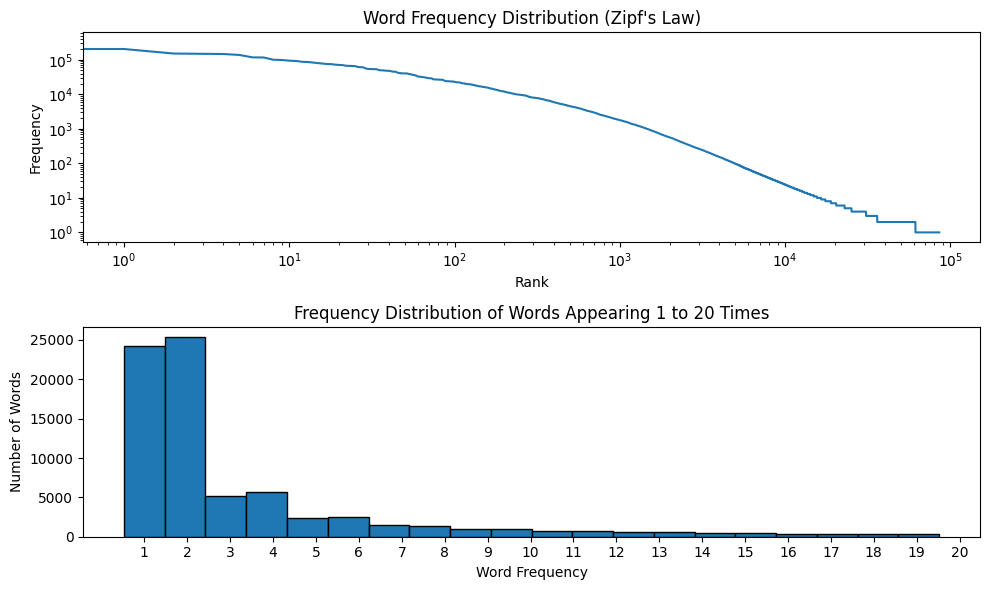

In [64]:
plot_word_frequencies(df_combined)

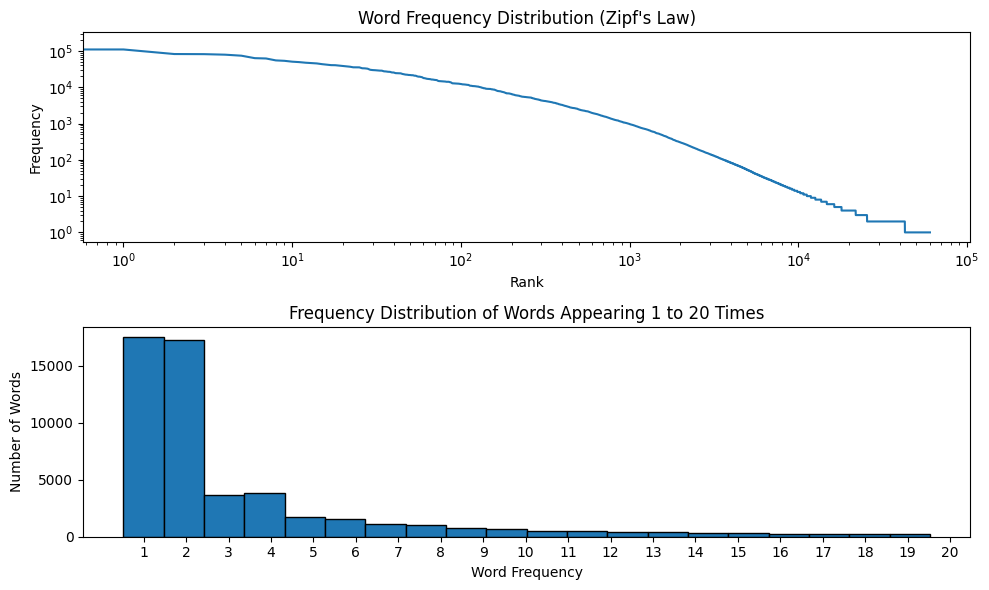

In [65]:
plot_word_frequencies(df_combined2)

We explored the words that appear only once or twice in the dataset through a word cloud. The assumption behind this exploration was that words occurring singularly might be indicative of typos or other anomalies. A quick observation, as seen in words like 'maps/information' and 'crisp/grain', highlights that many of these singleton words include slashes or other punctuation which may need cleaning to improve the overall quality of our text data.

To tackle the issue of infrequent words combined with slashes, we introduced the text_preprocessing2 function. This method identifies and separates terms, ensuring a clearer representation of our textual data.

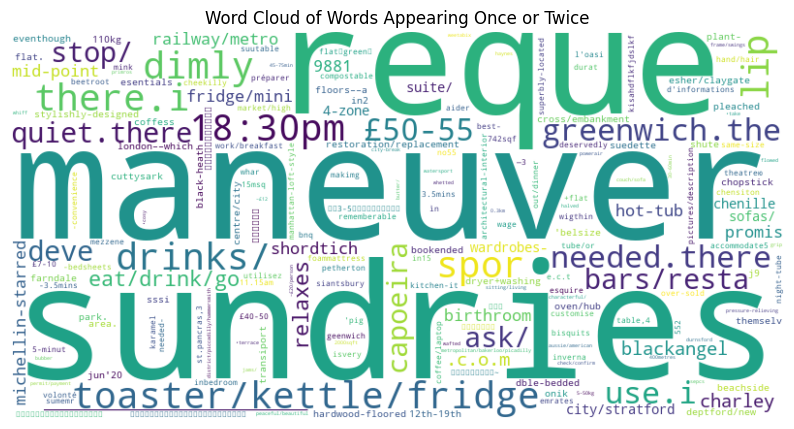

In [66]:
# List of words from the "combined_text" column
all_words = [word for sublist in df_combined["combined_text"] for word in sublist if word != "|||"]

# Word frequencies 
word_freq = Counter(all_words)

# Words that appear only once or twice
infrequent_words = {word: freq for word, freq in word_freq.items() if freq == 1 or freq == 2}

# Word cloud
wordcloud = WordCloud(width=800, height=400, background_color="white").generate_from_frequencies(infrequent_words)

# Plot
plt.figure(figsize=(10, 6))
plt.imshow(wordcloud, interpolation="bilinear")
plt.axis("off")
plt.title("Word Cloud of Words Appearing Once or Twice")
plt.show()

In [197]:
infrequent_words

first_50 = dict(islice(infrequent_words.items(), 50))

print(first_50)

{'sundries': 2, 'maneuver': 2, 'reque': 2, 'miute': 1, 'toaster/kettle/fridge': 2, 'irvin': 1, 'gelatiera': 1, 'licking': 1, 'lip': 2, 'dimly': 2, 'rokesly': 1, '18:30pm': 2, '20:30pm': 1, 'drinks/': 2, 'maps/information': 1, 'caffeteria': 1, 'spor': 2, 'there.i': 2, 'greenwich.the': 2, 'needed.there': 2, 'use.i': 2, '£50-55': 2, 'quiet.there': 2, 'great.there': 1, '00:00-08:00': 1, 'accessib': 1, 'stop/': 2, 'gasho': 1, '7-10pm': 1, '423-425': 1, '1/tower': 1, 'ask/': 2, 'hammersmith/metropolitan': 1, 'monument/': 1, 'southfields/wimbledon/london': 1, 'bars/resta': 2, 'capoeira': 2, 'sol-a': 1, 'deve': 2, 'eat/drink/go': 2, 'relaxes': 2, 'blackangel': 2, '.c.o.m': 2, 'hibagon': 1, '1.5-': 1, 'charley': 2, 'railway/metro': 2, 'shordtich': 2, '9881': 2, 'fridge/mini': 2}


In [68]:
def text_preprocessing2(df):
    # List of words and word frequencies
    all_words = [word for sublist in df["combined_text"] for word in sublist]
    word_freq = Counter(all_words)

    # Words appearing only once or twice
    infrequent_words = {word for word, freq in word_freq.items() if freq == 1 or freq == 2}

    def process_tokens(tokens):
        new_tokens = []
        for token in tokens:
            # If token is infrequent and contains '/'
            if token in infrequent_words and "/" in token:
                new_tokens.extend(re.split("/", token))
            else:
                new_tokens.append(token)
        return new_tokens

    df["combined_text"] = df["combined_text"].apply(process_tokens)

    return df

In [69]:
# Apply function
df_combined = text_preprocessing2(df_combined)
df_combined2 = text_preprocessing2(df_combined2)

In [70]:
# Llist of words from the "combined_text" column
all_words2 = [word for sublist in df_combined["combined_text"] for word in sublist if word != "|||"]

# Word frequencies
word_freq2 = Counter(all_words2)

# Words appear only once or twice
infrequent_words2 = {word: freq for word, freq in word_freq2.items() if freq == 1 or freq == 2}

Through transformation, we effectively reduced the number of infrequent words by 19.34%, preserving significant information that might have otherwise been discarded.

In [71]:
print(f"Before transformation: {len(infrequent_words)} infrequent words.")
print(f"After transformation: {len(infrequent_words2)} infrequent words.")

reduction = len(infrequent_words) - len(infrequent_words2)
percentage_saved = (reduction / len(infrequent_words2)) * 100

print(f"We were able to save {percentage_saved:.2f}% of infrequent words by not deleting them after transformation.")

Before transformation: 49548 infrequent words.
After transformation: 41517 infrequent words.
We were able to save 19.34% of infrequent words by not deleting them after transformation.


The rest of the infrequent words that appear only once or twice were eliminated to reduce noise and prevent overfitting on terms that are unlikely to generalize to new data.

In [72]:
def remove_infrequent_tokens(df):

    all_words = [word for sublist in df["combined_text"] for word in sublist]
    word_freq = Counter(all_words)

    # Words appear only once or twice
    infrequent_words = {word for word, freq in word_freq.items() if freq == 1 or freq == 2}

    def process_tokens(tokens):
        return [token for token in tokens if token not in infrequent_words]

    df["combined_text"] = df["combined_text"].apply(process_tokens)

    return df

In [73]:
# Apply function
df_combined = remove_infrequent_tokens(df_combined)
df_combined2 = remove_infrequent_tokens(df_combined2)

# Overview
print(df_combined["combined_text"][0])

['attic', 'room', 'historic', 'greenwich', '|||', 'room', 'door', 'discreet', 'staircase', 'light', 'airy', 'open', 'plan', 'leaning', 'ceiling', 'provides', 'snug', 'hideaway', 'feel', 'benefit', 'fine', 'panoramic', 'view', 'london', '|||', 'double', 'room', 'available', 'historic', 'royal', 'greenwich', 'unesco', 'designated', 'world', 'heritage', 'site', 'significant', 'contribution', 'cultural', 'natural', 'heritage', 'world', 'house', 'peaceful', 'residential', 'street', 'panoramic', 'view', 'across', 'london', 'please', 'note', 'clean', 'bedding', 'towel', 'provided', 'whilst', 'prepare', 'breakfast', 'welcome', 'make', 'use', 'kitchen', 'facility', 'like', 'cereal', 'fruit', 'milk', 'tea', 'coffee', 'may', 'breakfast', 'light', 'refreshment', 'walk', 'house', 'hill', 'attic', 'room', 'second', 'storey', 'privacy', 'door', 'stair', 'tight', 'turn', 'top', 'make', 'trunk', 'large', 'suitcase', 'difficult', 'ask', 'assistance', 'required', 'key', 'access', 'house', 'available', 'r

We identified the 30 most common two-character words or symbols in our combined datasets

In [74]:
# Concatenate
all_tokens = df_combined["combined_text"].tolist() + df_combined2["combined_text"].tolist()

# List of tokens
words = [token for sublist in all_tokens for token in sublist]

# Tokens of length 2 that are not numeric
two_char_words = [word.lower().strip(",.?!'\"()[]{}") for word in words if len(word) == 2 and not word.isdigit()]

# 20 most common two-character words excluding numbers
common_two_char_words = [word for word in Counter(two_char_words).most_common() if not word[0].isdigit()][:30]

print(common_two_char_words)

[('s', 102467), ('tv', 45343), ('st', 22047), ('go', 17365), ('le', 16575), ('--', 13571), ('', 11965), ('m', 5399), ('en', 5398), ('o2', 5003), ('``', 4860), ('wc', 4698), ('de', 4478), ('pm', 4356), ('uk', 4020), ('rd', 3926), ('id', 2883), ('sq', 2533), ('d', 2432), ('km', 2383), ('hi', 1891), ('wo', 1888), ('la', 1765), ('ft', 1321), ('ca', 1242), ('hd', 1193), ('hr', 1087), ('et', 1029), ('£5', 997), ('wi', 952)]


After careful examination of various text samples, we can identify several characteristic structures in the data:

- **Time & Duration**: We observe tokens that indicate time periods and specific moments, such as "15mins" and "18:30pm". In our preprocessing steps, we transform these tokens into standardized time formats, for instance, converting "15mins" to "15 minute".

- **Tokens Smaller Than 3 Characters**: Our dataset contains short tokens like "i" and "'s". For improved consistency, we have chosen to delete tokens that have a length smaller than 3 characters, unless they represent numbers and are not in the "keep_short_words" list.

- **Dashed Words**: We come across dashed terms such as "check-in". These words are split into separate tokens.

- **Pound Tokens**: Tokens like "£50" appear in our samples. For these, we substitute symbols like "£" with the text "pound" and separate the following numerical value, resulting in two distinct tokens: "pound" and "50".

- **Punctuation in Tokens**: Instances of tokens containing periods, like ".please", are observed. We address this by removing the "." from such tokens.

- **Abbreviations**: Some abbreviations, notably "min", are present in the text. To maintain clarity, we have expanded certain common abbreviations, turning "min" into "minute".

Additionally, we often see numbers like 2,3,4 etc. as tokens in the data set. However, since we are leveraging GloVe embeddings later, which already cover both number and word forms, there is no need for manual conversion of these numbers.

In [75]:
def text_preprocessing3(df):

    all_words = [word for sublist in df["combined_text"] for word in sublist]
    word_freq = Counter(all_words)

    keep_short_words = ["tv", "wc", "id", "pm", "km", "hi", "go", "am", "uk"]

    def process_tokens(tokens):
        modified = True
        while modified:
            new_tokens = []
            modified = False
            for token in tokens:

                # Remove "."
                token = token.replace(".", "")
                token = token.replace("-", "")
                token = token.replace("o2", "arena") #o2 is an arena in london

                # Replace £ with "pound" and split
                if "£" in token:
                    parts = token.split("£")
                    new_tokens.append("pound")
                    if parts[1]:
                        new_tokens.append(parts[1])
                    modified = True
                    continue

                # Change "min" to "minute"
                if token in ["min", "minutes", "minu", "minut"]:
                    token = "minute"
                    modified = True

                # Handle tokens like "n't"
                if token == "n't":
                    continue

                # Change "approx" to "approximately"
                if token in ["approx", "ca"]:
                    token = "approximately"

                # Handle time related tokens
                if re.match(r"^\d+mins?$", token):
                    new_tokens.append(token[:-4])
                    new_tokens.append("minute")
                    modified = True
                    continue
                elif re.match(r"^\d+:\d+$", token):
                    parts = token.split(':')
                    new_tokens.extend(parts)
                    if parts[1] == "00":
                        new_tokens.append("hour")
                    else:
                        new_tokens.append("hours")
                    modified = True
                    continue

                # Split tokens with "/"
                if "/" in token:
                    new_tokens.extend(token.split("/"))
                    modified = True
                    continue

                # Insert "missing" between consecutive delimiters "|||"
                for i in range(len(tokens) - 1):
                    if tokens[i] == "|||" and tokens[i + 1] == "|||":
                        tokens.insert(i + 1, "missing")

                new_tokens.append(token)

            tokens = new_tokens

        # Remove tokens like ''
        tokens = [tok for tok in tokens if tok]

        return tokens

    df["combined_text"] = df["combined_text"].apply(process_tokens)

    # Remove tokens length < 3 (excluding the words in keep_short_words) and numbers
    df["combined_text"] = df["combined_text"].apply(lambda tokens: [tok for tok in tokens if len(tok) >= 3 or (tok in keep_short_words and not tok.isdigit())])

    return df

In [76]:
# Apply function
df_combined = text_preprocessing3(df_combined)
df_combined2 = text_preprocessing3(df_combined2)

# Overview
print(f"Number of tokens in first row: {len(df_combined.combined_text[0])}")
print(df_combined["combined_text"][0])

Number of tokens in first row: 226
['attic', 'room', 'historic', 'greenwich', '|||', 'room', 'door', 'discreet', 'staircase', 'light', 'airy', 'open', 'plan', 'leaning', 'ceiling', 'provides', 'snug', 'hideaway', 'feel', 'benefit', 'fine', 'panoramic', 'view', 'london', '|||', 'double', 'room', 'available', 'historic', 'royal', 'greenwich', 'unesco', 'designated', 'world', 'heritage', 'site', 'significant', 'contribution', 'cultural', 'natural', 'heritage', 'world', 'house', 'peaceful', 'residential', 'street', 'panoramic', 'view', 'across', 'london', 'please', 'note', 'clean', 'bedding', 'towel', 'provided', 'whilst', 'prepare', 'breakfast', 'welcome', 'make', 'use', 'kitchen', 'facility', 'like', 'cereal', 'fruit', 'milk', 'tea', 'coffee', 'may', 'breakfast', 'light', 'refreshment', 'walk', 'house', 'hill', 'attic', 'room', 'second', 'storey', 'privacy', 'door', 'stair', 'tight', 'turn', 'top', 'make', 'trunk', 'large', 'suitcase', 'difficult', 'ask', 'assistance', 'required', 'key',

In [77]:
# List of words
all_words = [word for sublist in df_combined["combined_text"] for word in sublist]

# Count 'MISSING'
missing_count = all_words.count("missing")

print(f"'MISSING' appears {missing_count} times in df_combined.")

'MISSING' appears 5157 times in df_combined.


After the data transformation, each row in our df_combined data frame represents an integrated and preprocessed text entry, segmented by the delimiter "|||" to distinguish distinct feature contributions.

In [78]:
df_combined.head()

,combined_text
0,"[attic, room, historic, greenwich, |||, room, ..."
1,"[lovely, garden, studio, private, access, |||,..."
2,"[comfi, apartment, close, wimbledon, tennis, c..."
3,"[luxury, room, heart, london, sw4, |||, luxury..."
4,"[excellent, city, apartment, private, patio, |..."


In [79]:
df_combined2.head()

,combined_text
0,"[ladbroke, grove, stylish, portobello, apartme..."
1,"[contemporary, design, notting, hill, |||, sty..."
2,"[ensuite, double, bedroom, |||, quiet, ensuite..."
3,"[double, room, balcony, magnificent, penthouse..."
4,"[suite, chelsea, |||, suite, comprises, bedroo..."


### 4.2 Text Data EDA

After cleaning the text data, we move on to exploring it more closely with textual EDA. This step helps us see the main patterns and trends in our text data. By looking at things like word frequencies and distributions, we can get a good sense of what our data is about before diving into modeling.

#### 4.2.1 Most Used Words

For both the training and testing datasets, the top three words predominantly used are "london", "room", and "minute". A closer look reveals that the word frequency in both groups is almost identical, with the exception of the words "house" and "flat", which have swapped places 10 and 11.

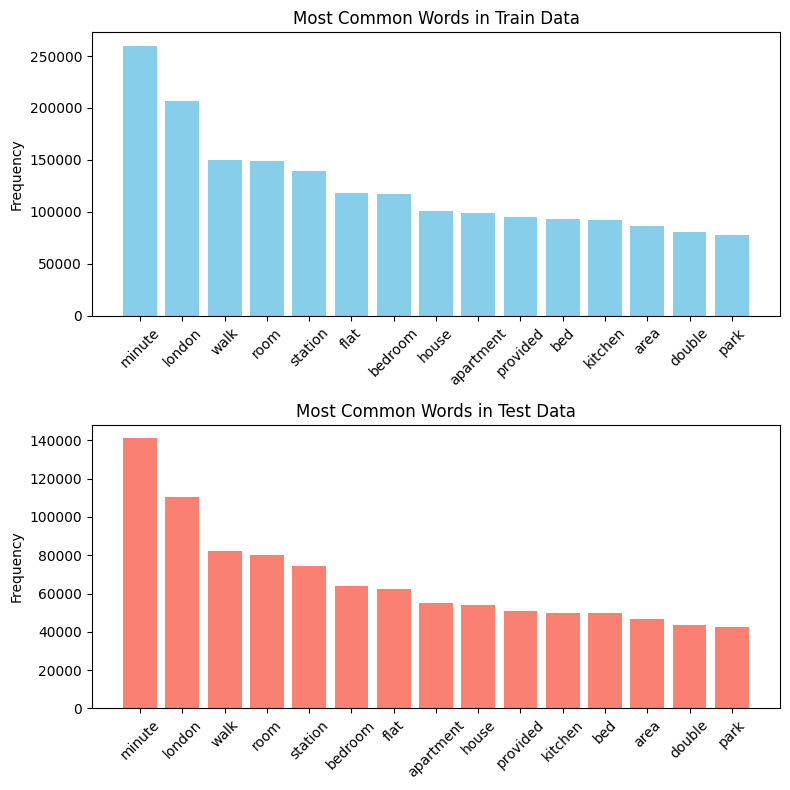

In [80]:
fig, axes = plt.subplots(nrows=2, ncols=1, figsize=(8, 8))

# For df_combined
all_words = [word for words in df_combined["combined_text"] for word in words if word != "|||"]
word_freq = Counter(all_words)
most_common_words = word_freq.most_common(15)
words, counts = zip(*most_common_words)
axes[0].bar(words, counts, color="skyblue")
axes[0].set_title("Most Common Words in Train Data")
axes[0].set_ylabel("Frequency")
axes[0].tick_params(axis="x", rotation=45)

# For df_combined2
all_words2 = [word for words in df_combined2["combined_text"] for word in words if word != "|||"]
word_freq2 = Counter(all_words2)
most_common_words2 = word_freq2.most_common(15)
words2, counts2 = zip(*most_common_words2)
axes[1].bar(words2, counts2, color="salmon")
axes[1].set_title("Most Common Words in Test Data")
axes[1].set_ylabel("Frequency")
axes[1].tick_params(axis="x", rotation=45)

plt.tight_layout()
plt.show()

In addition, we created a chart of "most used words" to analyse text features in different price segments. These prices were divided into three categories based on quantiles: low (0-55 USD per night), medium (55-110 USD per night) and high (110-500 USD per night). When looking at the top 10 words for each category, interesting patterns can be seen. The word "london" remains a consistent highlight across all groups, indicating its central role in the listings. Interestingly, words such as "room" and "house" are most prevalent in the lower price category, while terms such as "flat" and "apartment" tend to be more prevalent in the middle price category. The prominence of "bedroom" in the high price range perhaps indicates larger or more luxurious accommodation that has a separate bedroom. This raises questions about potential factors that influence price beyond the type of property, such as location, amenities or overall quality.

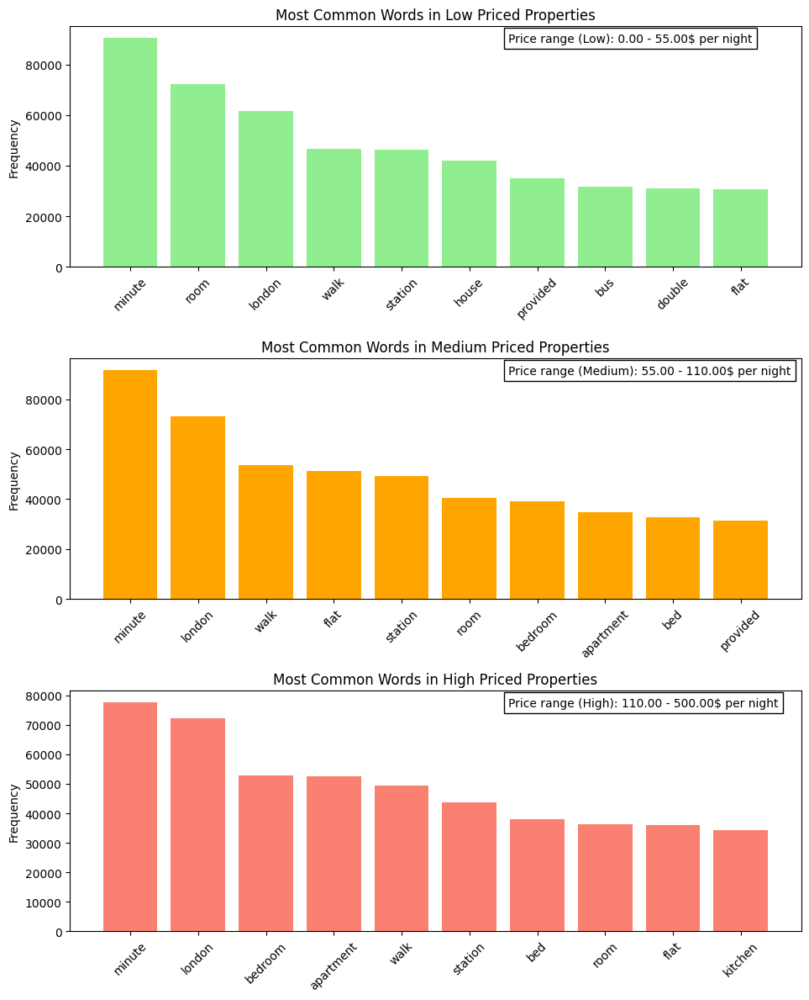

In [81]:
# Price categories based on quantiles
quantiles = np.quantile(np.exp(y_log), [0.33, 0.66])

# Function to categorize prices
def categorize_price(price):
    if price <= quantiles[0]:
        return "low"
    elif price <= quantiles[1]:
        return "medium"
    else:
        return "high"

# Price categories
price_categories = [categorize_price(price) for price in np.exp(y_log)]

fig, axes = plt.subplots(nrows=3, ncols=1, figsize=(10, 12))

price_ranges = {
    "low": (0, quantiles[0]),
    "medium": (quantiles[0], quantiles[1]),
    "high": (quantiles[1], max(np.exp(y_log)))
}

for idx, cat in enumerate(["low", "medium", "high"]):

    # Filter rows 
    filtered_texts = df_combined[pd.Series(price_categories) == cat]["combined_text"]

    # All words for category
    all_words = [word for sublist in filtered_texts for word in sublist if word != "|||"]
    word_freq = Counter(all_words)

    # 10 most common words
    most_common_words = word_freq.most_common(10)
    words, counts = zip(*most_common_words)

    # Plot
    axes[idx].bar(words, counts, color=["lightgreen", "orange", "salmon"][idx])
    axes[idx].set_title(f"Most Common Words in {cat.capitalize()} Priced Properties")
    axes[idx].set_ylabel("Frequency")
    axes[idx].tick_params(axis="x", rotation=45)

    # Price range
    price_range_text = f"Price range ({cat.capitalize()}): {price_ranges[cat][0]:.2f} - {price_ranges[cat][1]:.2f}$ per night"
    axes[idx].text(0.6, 0.95, price_range_text, transform=axes[idx].transAxes, 
                   fontsize=10, va='center',
                   bbox=dict(facecolor="white", edgecolor="black"))

plt.tight_layout()
plt.show()

#### 4.2.1 Distribution of Words

The distribution of word counts in the training and test data sets is very similar, each showing a right skewed pattern. This skew indicates that most of the bids use shorter descriptions, while longer descriptions are less common. 

In analyzing the description lengths, the training data has an average of around 269.38 words, indicating most listings offer fairly detailed insights. Its span, from a brief 16 to a comprehensive 756 words, mirrors the test data which averages slightly higher at 269.9 words and varies from 18 to an impressive 765 words. This parallel distribution between training and test sets underscores their consistency.

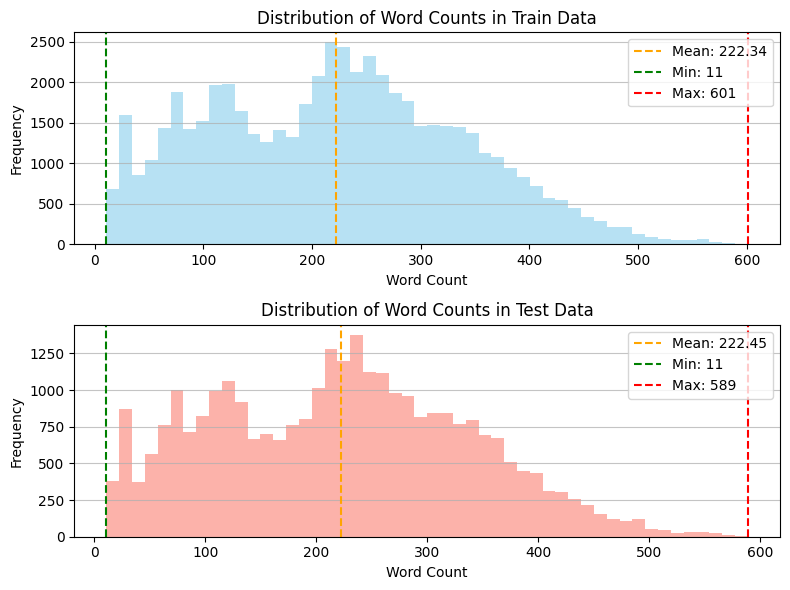

In [82]:
# Compute word counts
word_counts_train = df_combined["combined_text"].apply(len)
word_counts_test = df_combined2["combined_text"].apply(len)

fig, axes = plt.subplots(nrows=2, ncols=1, figsize=(8, 6))

# Plot for Train Data
min_wc_train = word_counts_train.min()
max_wc_train = word_counts_train.max()
mean_wc_train = word_counts_train.mean()

axes[0].hist(word_counts_train, bins=50, color="skyblue", alpha=0.6)
axes[0].axvline(mean_wc_train, color="orange", linestyle="--", 
                label="Mean: {:.2f}".format(mean_wc_train))
axes[0].axvline(min_wc_train, color="g", linestyle="--", label="Min: {}".format(min_wc_train))
axes[0].axvline(max_wc_train, color="r", linestyle="--", label="Max: {}".format(max_wc_train))
axes[0].set_title("Distribution of Word Counts in Train Data")
axes[0].set_xlabel("Word Count")
axes[0].set_ylabel("Frequency")
axes[0].legend(loc="upper right")
axes[0].grid(axis="y", alpha=0.75)

# Plot for Test Data
min_wc_test = word_counts_test.min()
max_wc_test = word_counts_test.max()
mean_wc_test = word_counts_test.mean()

axes[1].hist(word_counts_test, bins=50, color="salmon", alpha=0.6)
axes[1].axvline(mean_wc_test, color="orange", linestyle="--", 
                label="Mean: {:.2f}".format(mean_wc_test))
axes[1].axvline(min_wc_test, color="g", linestyle="--", label="Min: {}".format(min_wc_test))
axes[1].axvline(max_wc_test, color="r", linestyle="--", label="Max: {}".format(max_wc_test))
axes[1].set_title("Distribution of Word Counts in Test Data")
axes[1].set_xlabel("Word Count")
axes[1].set_ylabel("Frequency")
axes[1].legend(loc="upper right")
axes[1].grid(axis="y", alpha=0.75)

plt.tight_layout()
plt.show()

### 4.3 Embeddings

GloVe, or "Global Vectors for Word Representation," is a popular word embedding technique. These embeddings are useful for converting words into dense vectors that capture semantic meanings. For our project, we will use pre-trained GloVe vectors that provide a 300-dimensional vector for each word. (https://nlp.stanford.edu/projects/glove/)

In [83]:
glove_path = r"C:\Users\I551917\Documents\philipphabicht_230514\ADAMS\glove.6B.300d.txt"

In [84]:
def load_glove_model(File):

    print("Loading Glove Model")
    glove_model = {}
    with open(File, "r", encoding="utf-8") as f:
        for line in f:
            split_line = line.split()
            word = split_line[0]
            embedding = np.array(split_line[1:], dtype=np.float64)
            glove_model[word] = embedding
    print(f"{len(glove_model)} words loaded!")

    return glove_model

In [85]:
# Load embeddings
glove_model = load_glove_model(glove_path)

Loading Glove Model
400001 words loaded!


The get_embeddings function transforms text data into their GloVe embeddings. For words not present in the GloVe model, we use the average embedding technique, as it offers a neutral representation, mitigating extreme vector values that could arise from unfamiliar words.

In [86]:
# Get embeddings function
def get_embeddings(text_data, glove_model):

    embeddings = []
    glove_values = np.array(list(glove_model.values()))

    # Using average embedding for out-of-vocabulary words
    oov_embedding = np.mean(glove_values, axis=0)

    for sentence in text_data:
        sentence_embeddings = []
        for word in sentence:
            embedding = glove_model.get(word, oov_embedding)
            sentence_embeddings.append(embedding)
        embeddings.append(sentence_embeddings)

    return embeddings

In [87]:
# Get embeddings
embeddings = get_embeddings(df_combined["combined_text"], glove_model)
embeddings2 = get_embeddings(df_combined2["combined_text"], glove_model)

---
## 5. Model Building

After careful data cleaning and an extensive exploration phase, we are now well equipped to dive into the heart of our project: model building. Our goal is to predict prices using our numerical and textual features. Here is how we will proceed:

**Modeling with Numerical Data**: We begin by applying traditional machine learning models such as Linear Regression, Random Forest, XGBoost and a Feedforward neural network to our numerical data, capturing both linear and non linear patterns. We always start with the simplest to the most complex model.

**Modeling Text Data**: Moving to our preprocessed text data, we will apply methods starting with LSTM, BiLSTM and in the end we will build a DistelBert model which is some kind of transformer. 

**Combining numeric and text data**: We will combine our insights from both types of data and develop a model that simultaneously process numerical and textual inputs to improve prediction accuracy.

**Evaluation of test data**: Our final model  will then be applied to test data on Kaggle to assess their applicability in practice.

Root Mean Square Error (RMSE) is our chosen metric here that measures the average amount of prediction error in the same unit as the dependent variable. It penalises larger errors more heavily, emphasising the accuracy and reliability of our models predictions.

### 5.1 Numeric Prediction Models

#### 5.1.1 Linear Regression

The first and one of the most basic models that we use is Linear Regression, prized for its simplicity and interpretability, leading to an RMSE score of 0.4179. 

In [88]:
# Set seed
random.seed(10)

# LR Model
lr = LinearRegression()

# 10 fold CV
kf = KFold(n_splits=10, shuffle=True, random_state=50)

rmse_scores_lr = []
r2_scores_lr = []

# Loop
for train, val in kf.split(df_num_scaled):
    X_train_fold, X_val_fold = df_num_scaled.iloc[train], df_num_scaled.iloc[val]
    y_train_fold, y_val_fold = y_log.iloc[train], y_log.iloc[val]

    lr.fit(X_train_fold, y_train_fold)
    y_pred = lr.predict(X_val_fold)

    rmse_scores_lr.append(mean_squared_error(y_val_fold, y_pred, squared=False))
    r2_scores_lr.append(r2_score(y_val_fold, y_pred))

# Print average RMSE
print(f"Average RMSE (from 10 folds): {np.mean(rmse_scores_lr):.4f}")

Average RMSE (from 10 folds): 0.4179


#### 5.1.2 Random Forest

To see if we can improve our prediction following a non-linear approach using Random Forest. Indeed, we could boost our performance of the RMSE with a new score of 0.3765.

In [89]:
# Set seed
random.seed(10)

# RF model
rf = RandomForestRegressor(n_estimators=1000, max_depth=None, 
                           max_samples=0.1, random_state=50, n_jobs=10)

# 10 fold CV
kf = KFold(n_splits=10, shuffle=True, random_state=50)

rmse_scores_rf = []

for train, val in kf.split(df_num_scaled):
    X_train_fold, X_val_fold = df_num_scaled.iloc[train], df_num_scaled.iloc[val]
    y_train_fold, y_val_fold = y_log.iloc[train], y_log.iloc[val]

    rf.fit(X_train_fold, y_train_fold)
    y_pred = rf.predict(X_val_fold)

    rmse_scores_rf.append(mean_squared_error(y_val_fold, y_pred, squared=False))

# Average RMSE
print(f"Average RMSE (from 10 folds): {np.mean(rmse_scores_rf):.4f}")

Average RMSE (from 10 folds): 0.3765


#### 5.1.3 XGBoost

After trying the Random Forest with a notable RMSE of 0.3764, showing improvement over the Linear Regressions RMSE of 0.4102, we aim to further enhance our prediction accuracy by using boosting. Random Forest and XGBoost differ fundamentally: the former uses bagging, creating several decision trees during training and merging their outputs, whereas XGBoost employs boosting, building trees sequentially where each tree corrects its prior errors. The advantages of XGBoost, including built in regularization to prevent overfitting and optimised tree pruning make it a powerful choice to explore after Random Forest.

We can also see an improvement in performance in the XGBoost model with an RMSE of 0.3596.

In [90]:
# Set seed
random.seed(10)

# Initialize XGBoost regressor
xgb_model = xgb.XGBRegressor(n_estimators=1000, learning_rate=0.05, max_depth=5, 
                             random_state=50, n_jobs=10)

# Setup the 10-fold cross-validation
kf = KFold(n_splits=10, shuffle=True, random_state=111)

rmse_scores_xgb = []

for train, val in kf.split(df_num_scaled):
    X_train_fold, X_val_fold = df_num_scaled.iloc[train], df_num_scaled.iloc[val]
    y_train_fold, y_val_fold = y_log.iloc[train], y_log.iloc[val]

    xgb_model.fit(X_train_fold, y_train_fold)
    y_pred = xgb_model.predict(X_val_fold)

    rmse_scores_xgb.append(mean_squared_error(y_val_fold, y_pred, squared=False))

# Print the average RMSE from all the folds
print(f"Average RMSE (from 10 folds): {np.mean(rmse_scores_xgb):.4f}")

Average RMSE (from 10 folds): 0.3596


In [91]:
# Create a dictionary with model names and RMSEs
data = {
    "Model": ["Linear Regression", "Random Forest", "XGBoost"],
    "RMSE": [np.mean(rmse_scores_lr), np.mean(rmse_scores_rf), np.mean(rmse_scores_xgb)]
}

# Convert the dictionary to a DataFrame
df_rmse = pd.DataFrame(data)
df_rmse

,Model,RMSE
0,Linear Regression,0.417914
1,Random Forest,0.376473
2,XGBoost,0.359553


#### 5.1.4 Feedforward Neural Network

As we move forward with our modelling approach, it is important to also consider a Feedforward Neural Network for numerical feature prediction. Since our DistilBERT model, which we will create later, will be built with PyTorch, it is advantageous to also structure our FFNN with the PyTorch framework for an easy integration. This will later simplify a combination of our text based DistilBERT model with the FFNN for combined text and numerical data predictions.

**Note**: In addition to our modelling strategy, it is worth mentioning that the Feedforward neural network, as well as other neural network models discussed later, were trained on Google Colabs GPU. This significantly accelerated the training process. After training, the models were saved, downloaded and then imported back into our working environment. Although the code to train these models is provided for reference, we will not retrain them in this context due to computational costs and time constraints.

In [92]:
# Transform to tensors
X = df_num_scaled.to_numpy()
y = y_log.to_numpy()

X_tensor = torch.tensor(X, dtype=torch.float32)
y_tensor = torch.tensor(y, dtype=torch.float32).view(-1, 1)

In [93]:
class CustomDatasetFF(Dataset):
    def __init__(self, features, targets):
        self.features = features
        self.targets = targets
        
    def __len__(self):
        return len(self.targets)
    
    def __getitem__(self, idx):
        return self.features[idx], self.targets[idx]

In [94]:
# Create dataset from tensors
datasetFF = CustomDatasetFF(X_tensor, y_tensor)

In [95]:
# Data splitting
train_size = int(0.7 * len(datasetFF))
val_size = int(0.15 * len(datasetFF))
test_size = len(datasetFF) - train_size - val_size

train_datasetFF, val_datasetFF, test_datasetFF = random_split(datasetFF, 
                                                        [train_size, val_size, test_size])

In [96]:
# Pytorch dataloader
train_loaderFF = DataLoader(train_datasetFF, batch_size=64, shuffle=True)
val_loaderFF = DataLoader(val_datasetFF, batch_size=64, shuffle=False)
test_loaderFF = DataLoader(test_datasetFF, batch_size=64, shuffle=False)

In [97]:
class FeedForwardModel(nn.Module):
    def __init__(self, input_dim):
        super(FeedForwardModel, self).__init__()
        self.fc1 = nn.Linear(input_dim, 256)
        self.fc2 = nn.Linear(256, 128)
        self.dropout1 = nn.Dropout(0.2)
        self.fc3 = nn.Linear(128, 64)
        self.dropout2 = nn.Dropout(0.1)
        self.fc4 = nn.Linear(64, 1)

    def forward(self, x):
        x = F.relu(self.fc1(x))
        x = F.relu(self.fc2(x))
        x = self.dropout1(x)
        x = F.relu(self.fc3(x))
        x = self.dropout2(x)
        return self.fc4(x)

For the FFNN model, we experimented with different learning rates and finally settled on 0.0005. The architecture of our final feedforward neural network was chosen on a trial and error approach. We tested different layers, varied the number of neurons and played with different dropout rates. The result of this iterative refinement process is the model presented here.

The final FFNN model takes an input of 68 numerical features, processes it through four linear layers of decreasing size (256, 128, 64, then a single output), and includes dropout layers (0.2 and 0.1 probabilities) after the first and third layers to improve regularization and reduce overfitting.

In [110]:
# Input shape
input_dim = X_tensor.shape[1] 

# Import model
modelFF = FeedForwardModel(input_dim)
modelFF.load_state_dict(torch.load('FFNN.pt', map_location=torch.device('cpu')))
ffnn = modelFF
ffnn.eval()

FeedForwardModel(
  (fc1): Linear(in_features=68, out_features=256, bias=True)
  (fc2): Linear(in_features=256, out_features=128, bias=True)
  (dropout1): Dropout(p=0.2, inplace=False)
  (fc3): Linear(in_features=128, out_features=64, bias=True)
  (dropout2): Dropout(p=0.1, inplace=False)
  (fc4): Linear(in_features=64, out_features=1, bias=True)
)

In [111]:
# Optimizer 
optimizer = AdamW(modelFF.parameters(), lr=0.0005)

epochs = 100
total_steps = len(train_loaderFF) * epochs
scheduler = get_linear_schedule_with_warmup(optimizer, 
                                            num_warmup_steps=0, 
                                            num_training_steps=total_steps)

# MSE
mse_loss = nn.MSELoss()

# RMSE loss
def rmse_loss(predictions, labels):
    mse_val = mse_loss(predictions, labels)
    return torch.sqrt(mse_val)

C:\Users\I551917\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\transformers\optimization.py:411: FutureWarning:

This implementation of AdamW is deprecated and will be removed in a future version. Use the PyTorch implementation torch.optim.AdamW instead, or set `no_deprecation_warning=True` to disable this warning



In [112]:
def train_FFN(model, optimizer, scheduler, epochs, train_dataloader, val_dataloader, 
                clip_value=2, print_every=100, patience_limit=5):
   
    # Check if GPU is available, if not, default CPU
    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
    print(f"Using {device} for training.")

    # Early Stopping
    best_val_loss = float('inf')
    patience_counter = 0

    # RMSE train and val 
    train_losses = []
    val_losses = []

    for epoch in range(epochs):
        print(f"Epoch {epoch + 1}/{epochs}")
        print("-" * 10)

        # Train
        model.train()
        train_loss = 0.0

        for step, batch in enumerate(train_dataloader):
            batch_inputs, batch_labels = batch
            # Move batch data to device
            batch_inputs = batch_inputs.to(device)
            batch_labels = batch_labels.to(device).squeeze()

            model.zero_grad()
            outputs = model(batch_inputs).squeeze()
            loss = rmse_loss(outputs, batch_labels)
            loss.backward()

            torch.nn.utils.clip_grad_norm_(model.parameters(), clip_value)
            optimizer.step()
            scheduler.step()

            train_loss += loss.item()

            # Batch level details
            if (step + 1) % print_every == 0:
                print(f"Epoch {epoch + 1}/{epochs} | "
                      f"Batch {step + 1}/{len(train_dataloader)} | "
                      f"Batch RMSE: {loss.item():.4f}")

        avg_train_loss = train_loss / len(train_dataloader)
        print(f"Train RMSE: {avg_train_loss:.4f}")
        train_losses.append(avg_train_loss) 

        # Validation
        val_loss = 0.0
        model.eval()
        for batch in val_dataloader:
            batch_inputs, batch_labels = batch
            # Move batch data to device
            batch_inputs = batch_inputs.to(device)
            batch_labels = batch_labels.to(device).squeeze()

            with torch.no_grad():
                outputs = model(batch_inputs).squeeze()
                loss = rmse_loss(outputs, batch_labels)
            val_loss += loss.item()

        avg_val_loss = val_loss / len(val_dataloader)
        print(f"Validation RMSE: {avg_val_loss:.4f}")
        val_losses.append(avg_val_loss)  

        # Early Stopping
        if avg_val_loss < best_val_loss:
            best_val_loss = avg_val_loss
            torch.save(model.state_dict(), 'best_model.pt')  # Save the best model
            patience_counter = 0
        else:
            patience_counter += 1
            if patience_counter >= patience_limit:
                print("Early stopping triggered!")
                model.load_state_dict(torch.load('best_model.pt'))  # Load the best model when stopping
                break

    return model, train_losses, val_losses

In [160]:
# Reference for model training

#modelFF, train_rmse_listFF, val_rmse_listFF = train_FFN(modelFF, 
#                                                  optimizer, 
#                                                  scheduler, 
#                                                  epochs, 
#                                                  train_loaderFF, 
#                                                  val_loaderFF)

In [161]:
# Reference for plot of train and val rmse

# Plot
#actual_epochs = len(train_rmse_listFF)

#plt.figure(figsize=(8, 4))
#plt.plot(range(1, actual_epochs + 1), train_rmse_listFF, label='Train RMSE', color='#1f77b4')
#plt.plot(range(1, actual_epochs + 1), val_rmse_listFF, label='Validation RMSE', color='orange')
#plt.title("RMSE Progression Over Epochs for FFNN Model")
#plt.xlabel('Epochs')
#plt.xticks(range(1, actual_epochs + 1))
#plt.xlim(0.8, actual_epochs + 0.2)
#plt.legend()
#plt.savefig('FFNN_rmse_plot.png')
#plt.show()

For the training process, we had originally planned to train 100 epochs, keeping to a patience limit of 5 epochs. However, the rapid convergence of the model caused the training to stop prematurely at epoch 23. Therefore, we used the model saved after 17 epochs to ensure that we captured the most optimal state before any possible overfitting.

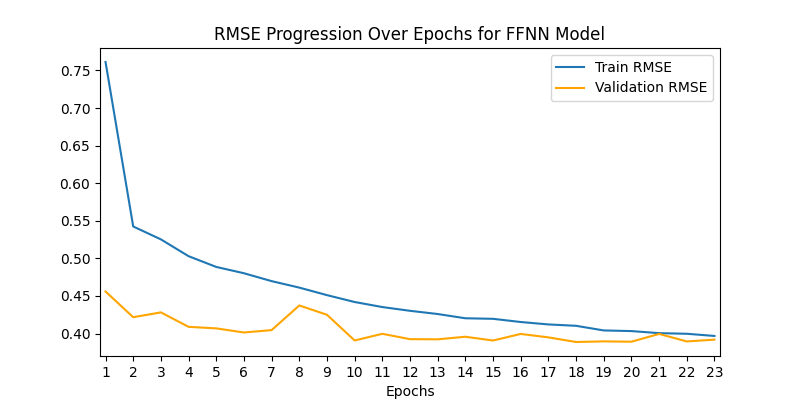

In [116]:
# Import plot
Image(filename='FFNN_rmse_plot.png')

In [117]:
def evaluate(model, dataloader, loss_fn):
  
    # Check if GPU is available, if not, default to CPU
    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
    model.to(device)

    model.eval()
    total_loss = 0.0
    
    with torch.no_grad():
        for inputs, labels in dataloader:
            inputs, labels = inputs.to(device), labels.to(device)
            
            # Predictions
            outputs = model(inputs)
            
            # Calculate loss
            loss = loss_fn(outputs, labels)
            total_loss += loss.item()
    
    average_loss = total_loss / len(dataloader)
    return average_loss

The test RMSE for our FFNN model is 0.3650, which is a solid performance compared to other models. However, the XGBoost model with an RMSE of 0.3595 is surprisingly slightly better performing on the test set compared to the FFNN.

In [118]:
# Test
test_loss = evaluate(modelFF, test_loaderFF, rmse_loss)
print(f"Test RMSE Loss: {test_loss:.4f}")

Test RMSE Loss: 0.3650


In [107]:
# Add FFNN to RMSE table
df_rmse.loc[len(df_rmse)] = ['FFNN', test_loss]
df_rmse

,Model,RMSE
0,Linear Regression,0.417914
1,Random Forest,0.376473
2,XGBoost,0.359553
3,FFNN,0.365037


### 5.2 Text Prediction Models

#### 5.2.1 LSTM

The first model we chose for predicting Airbnb listing prices using text data is the Long Short-Term Memory (LSTM) network. While LSTMs belong to the broader family of recurrent neural networks (RNNs), they have certain special properties that make them advantageous for processing longer sequences of text data.

One of the notable properties of LSTMs is their ability to retain information over longer sequences, which allows them to remember context from the beginning of a sentence or even from previous sentences. This is crucial for tasks where understanding the whole context is important, such as predicting prices based on descriptions.

This increased memory capacity of LSTMs is due to their gate structure, which is quite different from the chain-like structure of simple RNNs. These gates carefully regulate the flow of information so that the network can decide what to remember and what to forget. This architecture effectively solves the problem of simple RNNs: the problem of vanishing or exploding gradients. Such problems often slow down the learning process for long sequences, which is why LSTMs are preferred for tasks that require understanding longer passages of text.

Before we get into the LSTMs, we should set the stage for preprocessing the data. We split our data into three different sets: 70% for training, 15% for validation and 15% for testing. This ensures that we have separate data sets for training the model, tuning the hyperparameters and evaluating the performance.

One of the most important preprocessing steps for LSTMs is to ensure that our input data is of a consistent and fixed length. This is critical due to the sequential nature of the LSTM model. Text data, such as sentences, often vary in length. To address this variability, we use the pad_sequences function. This function standardizes the length of sentences by padding shorter sequences with zeros, ensuring that each input matches the fixed length requirements of the LSTM. For our dataset, each standardized sentence is represented as a 418x300 matrix.

In [119]:
# Split into training and validation sets
X_train, X_temp, y_train, y_temp = train_test_split(embeddings, y_log, test_size=0.3, random_state=42)

# Split temp set in validation and test sets
X_val, X_test, y_val, y_test = train_test_split(X_temp, y_temp, test_size=0.5, random_state=42)

print(f"Training set size: {len(X_train)}")
print(f"Validation set size: {len(X_val)}")
print(f"Test set size: {len(X_test)}")

Training set size: 38698
Validation set size: 8293
Test set size: 8293


In [120]:
# Pad the sequences to have the same length
sequence_lengths = [len(sentence) for sentence in X_train]
percentile_95 = int(np.percentile(sequence_lengths, 95))
print(f'Sentence length: {percentile_95}')

X_train_padded = pad_sequences(X_train, maxlen=percentile_95, dtype='float16', padding='post')
X_val_padded = pad_sequences(X_val, maxlen=percentile_95, dtype='float16', padding='post')
X_test_padded = pad_sequences(X_test, maxlen=percentile_95, dtype='float16', padding='post')

print(f'Embedding length: {X_train_padded.shape[2]}')

Sentence length: 418
Embedding length: 300


To optimize our LSTM model for Airbnb listing price predictions, we carried out hyperparameter tuning on three key parameters: **units**, **dropout rate**, and **optimizer**. Our goal was to minimize the RMSE and closely monitor the RMSE of both training and validation sets to detect any signs of overfitting.

Ideally, a more extensive search for hyperparameters would have been beneficial, with additional parameters such as the batch size, a wider number of units, a different regularisation techniques that go beyond dropout and a few more epochs. However, given the computational cost of such rich tuning and the limitation of our computational resources, we had to prioritise and focus on the most important hyperparameters. For this reason, this section will not present the entire process of tuning the hyperparameters. Instead, I will only summarise the most relevant results of the tuning and highlight the optimal model configuration below. This will be the same for the other upcoming NLP models.

In [121]:
# Hyperparameter
#unit_values = [50, 100]
#dropout_rates = [0.2, 0.5]
#optimizers = ['adam', 'rmsprop']

In [122]:
def root_mean_squared_error(y_true, y_pred):
    return tf.sqrt(tf.reduce_mean(tf.square(y_pred - y_true)))

In [162]:
# Model is not trained here

# Seed
#random.seed(10)

# Model building
#model = Sequential()
#model.add(LSTM(units=50, dropout=0.5, input_shape=(X_train_padded.shape[1], X_train_padded.shape[2])))
#model.add(Dense(1, activation='linear'))
#model.compile(optimizer='adam', loss='mean_squared_error', metrics=[root_mean_squared_error])

# Model checkpoint
#checkpoint = ModelCheckpoint('lstm_model.h5', 
#                             monitor='val_loss',
#                             verbose=1,
#                             save_best_only=True,
#                             mode='min')

# Early stopping
#early_stop = EarlyStopping(monitor='val_loss', mode='min', verbose=1, patience=3)

# Train model
#history = model.fit(X_train_padded, y_train, 
#                    validation_data=(X_val_padded, y_val),
#                    epochs=30, 
#                    batch_size=64, 
#                    callbacks=[early_stop, checkpoint])

In [125]:
# Import model
lstm_model = load_model('lstm_model.h5', custom_objects={'root_mean_squared_error': root_mean_squared_error})

In [163]:
# Model is not trained here
stop_execution()

# Plot
#plt.figure(figsize=(8, 4))
#plt.plot(range(1, actual_epochs + 1), history.history['root_mean_squared_error'], label='Train RMSE')
#plt.plot(range(1, actual_epochs + 1), history.history['val_root_mean_squared_error'], label='Validation RMSE')
#plt.title("RMSE Progression Over Epochs for LSTM Model")
#plt.xlabel('Epochs')
#plt.xticks(range(1, actual_epochs + 1))
#plt.xlim(0.8, actual_epochs + 0.2)
#plt.legend()
#plt.savefig('lstm_rmse_plot.png')
#plt.show()

This code is for reference and will not execute

SystemExit: 0

C:\Users\I551917\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\IPython\core\interactiveshell.py:3516: UserWarning:

To exit: use 'exit', 'quit', or Ctrl-D.



After refining the hyperparameters, we deployed the BiLSTM model with 50 units, a dropout rate of 0.5, and employed the Adam optimizer based on lowest test rmse. 

We started with an epoch expectation of 30 epochs. However, the training was stopped after 28 epochs due to the activation of the early stopping mechanism. Since we used a patience of 3, the model that was trained until the 25th epoch was saved with the lowest validation RMSE. 

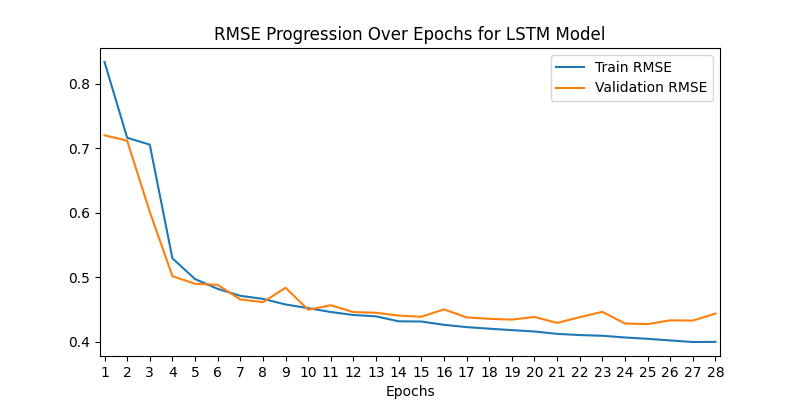

In [127]:
# Import plot for training and validation error
Image(filename='lstm_rmse_plot.png')

Using the saved LSTM model, we achieved a test rmse of 0.4277.

In [128]:
# Test set application
random.seed(10)
test_loss, test_rmse = lstm_model.evaluate(X_test_padded, y_test)
print(f"Test RMSE: {test_rmse:.4f} -- Units: 50, Dropout: 0.5, Optimizer: adam")

260/260 [==============================] - 41s 139ms/step - loss: 0.1905 - root_mean_squared_error: 0.4277
Test RMSE: 0.4277 -- Units: 50, Dropout: 0.5, Optimizer: adam


In [129]:
# Add LSTM to RMSE table
df_rmse.loc[len(df_rmse)] = ['LSTM', test_rmse]
df_rmse

,Model,RMSE
0,Linear Regression,0.417914
1,Random Forest,0.376473
2,XGBoost,0.359553
3,FFNN,0.365037
4,LSTM,0.427671


#### 5.2.2 BiLSTM

The second model we chose is the Bidirectional Long Short-Term Memory (BiLSTM) network. In contrast to traditional LSTMs that process data from past states, BiLSTMs simultaneously analyze data from past and future states. This bidirectional approach improves the models ability to understand context from the overall sequence, potentially capturing patterns that LSTMs might miss.

Further, we use the same settings for data splitting and padding as in the above described LSTM step before.

When setting the hyperparameters, we used the same settings as for the LSTM, except for the dropout rate. This is due to the higher complexity of the BiLSTM compared to the LSTM. The dropout rate has now been tested with 0.3 and 0.6.

Again, due to the high computational effort, the result of this tuning process will unfortunately not be calculated in the final version of this notebook.

In [130]:
# Hyperparameter
#unit_values = [50, 100]
#dropout_rates = [0.3, 0.6]
#optimizers = ['adam', 'rmsprop']

In [ ]:
# Model is not trained here
# Seed
#random.seed(10)

# Model building
#model = Sequential()
#model.add(Bidirectional(LSTM(units=50, dropout=0.6, return_sequences=False), 
                        input_shape=(X_train_padded.shape[1], X_train_padded.shape[2])))
#model.add(Dense(1, activation='linear'))
#model.compile(optimizer='adam', loss='mean_squared_error', metrics=[root_mean_squared_error])

# Model checkpoint 
#checkpoint = ModelCheckpoint('bidirectional_lstm_model.h5', 
                             monitor='val_loss',
                             verbose=1,
                             save_best_only=True,
                             mode='min')

# Early stopping
#early_stop = EarlyStopping(monitor='val_loss', mode='min', verbose=1, patience=3)

# Train model
#history = model.fit(X_train_padded, y_train, 
#                    validation_data=(X_val_padded, y_val),
#                    epochs=30, 
#                    batch_size=64, 
#                    callbacks=[early_stop, checkpoint])

In [132]:
# Import model
bilstm_model = load_model("bidirectional_lstm_model.h5", 
                          custom_objects={"root_mean_squared_error": root_mean_squared_error})

In [ ]:
# Reference

# Plot
#plt.figure(figsize=(8, 4))
#plt.plot(range(1, actual_epochs + 1), history.history['root_mean_squared_error'], label='Train RMSE')
#plt.plot(range(1, actual_epochs + 1), history.history['val_root_mean_squared_error'], label='Validation RMSE')
#plt.title("RMSE Progression Over Epochs for BiLSTM Model")
#plt.xlabel('Epochs')
#plt.xticks(range(1, actual_epochs + 1))
#plt.xlim(0.8, actual_epochs + 0.2)
#plt.legend()
#plt.savefig('bidirectional_lstm_rmse_plot.png')
#plt.show()

After fine tuning the hyperparameters, we decided on the BiLSTM model with 50 units, a dropout rate of 0.6 and the Adam optimiser, as it had the lowest test RMSE. 

Examination of the RMSE trends of the BiLSTM model during training and validation across epochs shows that the model learns quickly since there is a big decrease in errors in the first epochs. Remarkably, throughout training, both training and validation errors remained relatively parallel. Although we assumed a training span of 30 epochs, we stopped the training early after the 22nd epoch because the validation RMSE increased three times in a row. Consequently, we saved the models weights and biases trained after 19 epochs.

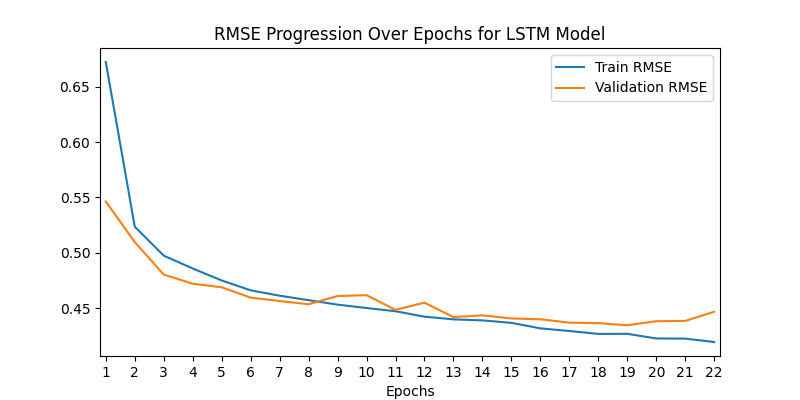

In [134]:
# Import plot of the training and validation error
# Yes, I know there is a spelling mistake in the plot title that should have been BiLSTM
# (Im sorry for this but unfortunately could not change it anymore)
Image(filename='bidirectional_lstm_rmse_plot.png')

When the BiLSTM model was applied to the test data with the optimal parameters, an RMSE test value of 0.4355 was obtained, which was surprisingly worse than that of the LSTM. Although the BiLSTM is more complex, it did not perform better, at least in this case.

In [135]:
# Evaluating on the test set
test_loss, test_rmse = bilstm_model.evaluate(X_test_padded, y_test)
print(f"Test RMSE: {test_rmse:.4f} -- Units: 50, Dropout: 0.6, Optimizer: adam")

260/260 [==============================] - 65s 234ms/step - loss: 0.1956 - root_mean_squared_error: 0.4335
Test RMSE: 0.4335 -- Units: 50, Dropout: 0.6, Optimizer: adam


In [143]:
# Add BiLSTM to RMSE table
df_rmse.loc[len(df_rmse)] = ['BiLSTM', test_rmse]
df_rmse

C:\Windows\Temp\ipykernel_6324\3469511370.py:2: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



,Model,RMSE
0,Linear Regression,0.417914
1,Random Forest,0.376473
2,XGBoost,0.359553
3,FFNN,0.365037
4,LSTM,0.427671
5,BiLSTM,0.433525


#### 5.2.3 BERT

Diving deeper into the world of NLP models, our journey takes us to BERT (Bidirectional Encoder Representations from Transformers). This model is an adaptation of the transformer architecture presented in the groundbreaking paper "Attention is All You Need", mainly for modelling sequence-to-sequence language translations. The distinctive feature of BERT is that it uses only the encoder part of the original transformer and allows it to be reused for a variety of NLP tasks, including regression tasks like ours. In this way, we aim to predict Airbnb prices more effectively. Compared to previous models such as LSTM and BiLSTM, BERT stands out as a particularly advanced approach.

**What makes BERT so special?**

The heart of BERT is the revolutionary transformer architecture, which has the following advantages in particular:

- **Parallel computation with positional encoding**: Traditional models such as LSTM or BiLSTM operate sequentially, processing one token at a time. BERT, which uses the transformers positional coding, processes entire sequences in a single pass. This position encoding ensures that the model understands the order of words without requiring sequential operations, allowing for fast parallel computations.

- **Holistic, bidirectional understanding through self-attention**: One of the outstanding features of the Transformer architecture is the self-attention mechanism. This self-attention allows the model to weigh the meaning of different words in the sequence based on the current processing context, so that each word "pays attention" to all other words, capturing complex relationships and dependencies. While BiLSTM requires two separate passes (forward and backward) to achieve bidirectionality, BERT accomplishes this in a single pass, capturing complex relationships and dependencies within the text. This leads to a deeper understanding of the text compared to BiLSTM.

- **Pre-trained excellence**: Apart from architectural innovations, BERTs capabilities are enhanced by its extensive pre-training. Having been trained on vast amounts of textual data, BERT inherently understands the rules of language setting it apart from models trained from the scratch.

- **Advantage of transfer learning and fine-tuning**: BERT is not only a pre-trained model, but also has considerable flexibility to adapt. When we apply BERT to our Airbnb dataset, it does not start from scratch. Instead, it uses the knowledge it has previously learned and adjusts its parameters in a process called fine-tuning. Through fine-tuning, BERT tunes its parameters to precisely match our specific regression problem, allowing it to predict Airbnb prices while leveraging its broader linguistic understanding. This combination between general knowledge and specific task optimization illustrates the effectiveness of transfer learning in NLP.

Here we use DistilBert, a simplified version of the original BERT model. DistilBert was designed to be less complex, for example by reducing the number of layers from 12 to 6. This decision was primarily motivated by computational constraints that allowed us to achieve BERT like performance.

Building and fine tuning a BERT model was not an easy task and not part of the lecture, but I was still very much interested in trying something new and getting a great test performance. Thats why I used especially this Medium article (https://medium.com/ilb-labs-publications/fine-tuning-bert-for-a-regression-task-is-a-description-enough-to-predict-a-propertys-list-price-cf97cd7cb98a) as a guide. 

In [144]:
# Remember our BERT data set that was not preprocessed
df_bert['combined_text'][0]

'Attic Room in historic Greenwich [SEP] The room does not have a door but its own discreet staircase. It is light, airy and open plan. The leaning ceiling provides  a snug hideaway feel and  benefits from a fine panoramic view of London. [SEP] Double room available in historic royal Greenwich; a UNESCO designated World Heritage Site for its significant contribution to  the cultural and natural heritage of the world. The house is in a peaceful residential street that has panoramic views across London.  Please Note that clean bedding and towels are provided and whilst I do not prepare breakfast you are welcome to make use of kitchen facilities, and sundries like cereal, fruit, milk, tea, coffee I may have in, for breakfast and light refreshments. The walk to the house is up hill. The attic room is on the second storey it has privacy but no door. The stairs have a tight turn at the top which makes trunks and very large suitcases difficult to maneuver - ask if assistance is required. A key

In [145]:
# Import model
model_name = "distilbert-base-uncased"
tokenizer = DistilBertTokenizer.from_pretrained(model_name)

'(ReadTimeoutError("HTTPSConnectionPool(host='huggingface.co', port=443): Read timed out. (read timeout=10)"), '(Request ID: cad6176f-3999-4634-b789-9e6f5037e27b)')' thrown while requesting HEAD https://huggingface.co/distilbert-base-uncased/resolve/main/vocab.txt


We tokenize the combined text using BERTs tokenizer and ensure that any tokenized input is padded to a maximum length of 418. In addition, we create attention masks to distinguish real tokens from padding so that the model only focuses on the meaningful parts of the input.

In [146]:
# BERT tokenizer
input_ids = tokenizer(df_bert["combined_text"].tolist(),
                      truncation=True, padding="max_length", max_length=418, return_tensors="pt")

# Attention masks
attention_masks = (input_ids["input_ids"] != tokenizer.pad_token_id).float()

In [147]:
# Data splitting 70/15/15 ratio
train_inputs, temp_inputs, train_labels, temp_labels = train_test_split(input_ids["input_ids"], y_log,
                                                                       test_size=0.3, random_state=42)

train_masks, temp_masks, _, _ = train_test_split(attention_masks, y_log,
                                                test_size=0.3, random_state=42)

test_size = 0.5
val_inputs, test_inputs, val_labels, test_labels = train_test_split(temp_inputs, temp_labels,
                                                                   test_size=test_size, random_state=42)

val_masks, test_masks, _, _ = train_test_split(temp_masks, temp_labels,
                                               test_size=test_size, random_state=42)

# Reshape
train_labels = train_labels.values.reshape(-1)
val_labels = val_labels.values.reshape(-1)
test_labels = test_labels.values.reshape(-1)

In [148]:
# Data loader for pytorch
def create_dataloaders(inputs, masks, labels, batch_size):
    input_tensor = torch.tensor(inputs, dtype=torch.long)
    mask_tensor = torch.tensor(masks, dtype=torch.long)

    # As this is regression, labels tensor need to be type float
    labels_tensor = torch.tensor(labels, dtype=torch.float32)

    dataset = TensorDataset(input_tensor, mask_tensor, labels_tensor)
    dataloader = DataLoader(dataset, batch_size=batch_size, shuffle=True)
    return dataloader

In [149]:
# Batch size
batch_size = 64

# Apply function
train_dataloader = create_dataloaders(train_inputs, train_masks, train_labels, batch_size)
val_dataloader = create_dataloaders(val_inputs, val_masks, val_labels, batch_size)  
test_dataloader = create_dataloaders(test_inputs, test_masks, test_labels, batch_size)

C:\Windows\Temp\ipykernel_6324\3143663454.py:3: UserWarning:

To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).

C:\Windows\Temp\ipykernel_6324\3143663454.py:4: UserWarning:

To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).



In [150]:
class DistilBertRegressor(nn.Module):
    def __init__(self, drop_rate=0.3, freeze_distilbert=False):
        super(DistilBertRegressor, self).__init__()

        # DistilBERT model
        self.distilbert = DistilBertModel.from_pretrained("distilbert-base-uncased")

        # Regression layer
        D_in, D_out = 768, 1  # DistilBERT outputs 768-dimensional embedding vector
        self.regressor = nn.Sequential(
            nn.Dropout(drop_rate),
            nn.Linear(D_in, D_out))

        if freeze_distilbert:
            for param in self.distilbert.parameters():
                param.requires_grad = False

    def forward(self, input_ids, attention_mask):
        outputs = self.distilbert(input_ids, attention_mask=attention_mask)
        cls_output = outputs.last_hidden_state[:, 0]
        return self.regressor(cls_output).squeeze() 

Our DistilBertRegressor utilizes a DistilBert architecture with 6 transformer blocks, each containing multi head self attention mechanisms and feedforward networks. It concludes with a regression layer consisting of dropout and a linear layer to produce the final output.

In [151]:
# Model import and architecture
model = DistilBertRegressor(drop_rate=0.3, freeze_distilbert=False)
model.load_state_dict(torch.load("bert_model.pt", map_location=torch.device("cpu")))
distilbert = model
distilbert

DistilBertRegressor(
  (distilbert): DistilBertModel(
    (embeddings): Embeddings(
      (word_embeddings): Embedding(30522, 768, padding_idx=0)
      (position_embeddings): Embedding(512, 768)
      (LayerNorm): LayerNorm((768,), eps=1e-12, elementwise_affine=True)
      (dropout): Dropout(p=0.1, inplace=False)
    )
    (transformer): Transformer(
      (layer): ModuleList(
        (0-5): 6 x TransformerBlock(
          (attention): MultiHeadSelfAttention(
            (dropout): Dropout(p=0.1, inplace=False)
            (q_lin): Linear(in_features=768, out_features=768, bias=True)
            (k_lin): Linear(in_features=768, out_features=768, bias=True)
            (v_lin): Linear(in_features=768, out_features=768, bias=True)
            (out_lin): Linear(in_features=768, out_features=768, bias=True)
          )
          (sa_layer_norm): LayerNorm((768,), eps=1e-12, elementwise_affine=True)
          (ffn): FFN(
            (dropout): Dropout(p=0.1, inplace=False)
            (lin1

In [152]:
# Optimizer
optimizer = AdamW(model.parameters(), lr=2e-5)

epochs = 15
total_steps = len(train_dataloader) * epochs
scheduler = get_linear_schedule_with_warmup(optimizer, num_warmup_steps=0, num_training_steps=total_steps)

# MSE
mse_loss = nn.MSELoss()

# Define RMSE loss
def rmse_loss(predictions, labels):
    mse = mse_loss(predictions, labels)
    return torch.sqrt(mse)

C:\Users\I551917\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\transformers\optimization.py:411: FutureWarning:

This implementation of AdamW is deprecated and will be removed in a future version. Use the PyTorch implementation torch.optim.AdamW instead, or set `no_deprecation_warning=True` to disable this warning



This function shows the training process of a model on provided data, with early stopping based on validation loss, and returns the trained model along with its train and validation RMSE over epochs.

In [153]:
def train(model, optimizer, scheduler, epochs, train_dataloader, val_dataloader, 
          clip_value=2, print_every=100, patience_limit=3):
    
    # Check if GPU is available, if not, default CPU
    device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
    model = model.to(device)
    
    # Implementing Early Stopping
    best_val_loss = float("inf")
    patience_counter = 0

    # RMSE for train and val
    train_losses = []
    val_losses = []

    for epoch in range(epochs):
        print(f"Epoch {epoch + 1}/{epochs}")
        print("-" * 10)

        # Train
        model.train()
        train_loss = 0.0

        for step, batch in enumerate(train_dataloader):
            batch_inputs, batch_masks, batch_labels = [item.to(device) for item in batch]
            model.zero_grad()
            outputs = model(batch_inputs, batch_masks).squeeze()
            loss = rmse_loss(outputs, batch_labels)
            loss.backward()

            clip_grad_norm_(model.parameters(), clip_value)
            optimizer.step()
            scheduler.step()

            train_loss += loss.item()

            # Print batch-level details
            if (step + 1) % print_every == 0:
                print(f"Epoch {epoch + 1}/{epochs} | "
                      f"Batch {step + 1}/{len(train_dataloader)} | "
                      f"Batch RMSE: {loss.item():.4f}")

        avg_train_loss = train_loss / len(train_dataloader)
        print(f"Train RMSE: {avg_train_loss:.4f}")
        train_losses.append(avg_train_loss) 

        # Validation
        val_loss = 0.0
        model.eval()
        for batch in val_dataloader:
            batch_inputs, batch_masks, batch_labels = [item.to(device) for item in batch]

            with torch.no_grad():
                outputs = model(batch_inputs, batch_masks).squeeze()
                loss = rmse_loss(outputs, batch_labels)
            val_loss += loss.item()

        avg_val_loss = val_loss / len(val_dataloader)
        print(f"Validation RMSE: {avg_val_loss:.4f}")
        val_losses.append(avg_val_loss)

        # Early Stopping check
        if avg_val_loss < best_val_loss:
            best_val_loss = avg_val_loss
            torch.save(model.state_dict(), "best_model.pt")  # Save the best model
            patience_counter = 0
        else:
            patience_counter += 1
            if patience_counter >= patience_limit:
                print("Early stopping triggered!")
                model.load_state_dict(torch.load("best_model.pt"))  # Load the best model when stopping
                break

    return model, train_losses, val_losses

In [ ]:
# Model Reference training

# Train model
#model, train_losses, val_losses = train(
#    model=model, 
#    optimizer=optimizer, 
#    scheduler=scheduler, 
#    epochs=epochs, 
#    train_dataloader=train_dataloader, 
#    val_dataloader=val_dataloader,
#    clip_value=2,
#    print_every=100,
#    patience_limit=3)

In [ ]:
# Reference

# Plot
#actual_epochs = len(train_losses)

#plt.figure(figsize=(8, 4))
#plt.plot(range(1, actual_epochs + 1), train_losses, label="Train RMSE", color="#1f77b4")
#plt.plot(range(1, actual_epochs + 1), val_losses, label="Validation RMSE", color="orange")
#plt.title("RMSE Progression Over Epochs for BERT Model")
#plt.xlabel("Epochs")
#plt.xticks(range(1, actual_epochs + 1))
#plt.xlim(0.8, actual_epochs + 0.2)
#plt.legend()
#plt.savefig("bert_rmse_plot.png")
#plt.show()

We trained the DistilBERT model with Adams base optimizer for a planned duration of 15 epochs. However, the early stopping mechanism was activated after only 8 epochs, which led us to save the model from the 5th epoch.

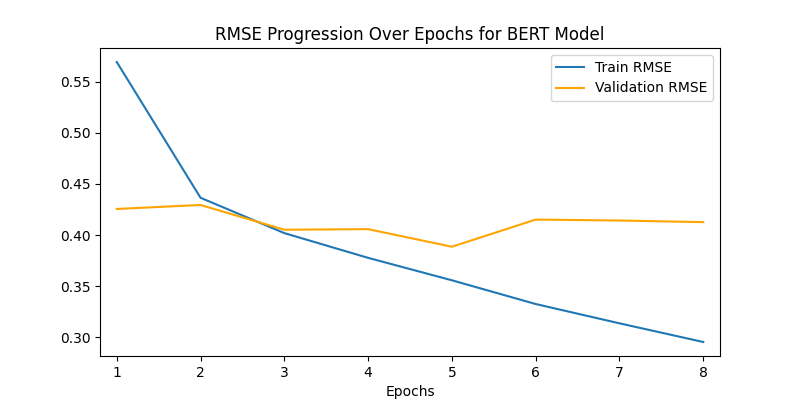

In [156]:
# Import image
Image(filename="bert_rmse_plot.png")

In [157]:
def test_model(model, test_dataloader):
    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
    model.to(device)

    predictions = []
    true_values = []

    model.eval()

    with torch.no_grad():
        for data, masks, labels in test_dataloader:
            data, masks, labels = data.to(device), masks.to(device), labels.to(device)
            outputs = model(data, attention_mask=masks)
            predictions.extend(outputs.cpu().numpy())
            true_values.extend(labels.cpu().numpy())

    predictions = np.array(predictions).squeeze()
    true_values = np.array(true_values).squeeze()
    rmse = np.sqrt(np.mean((predictions - true_values)**2))
    return rmse

DistilBERT yielded a notable improvement compared to LSTM and BiLSTM, achieving an RMSE score of 0.3973.

In [158]:
test_rmse = test_model(model, test_dataloader)
print(f"Test RMSE: {test_rmse:.4f}")

Test RMSE: 0.3973


In [159]:
# Add DistilBERT to RMSE table
df_rmse.loc[len(df_rmse)] = ["DistilBERT", test_rmse]
df_rmse

,Model,RMSE
0,Linear Regression,0.417914
1,Random Forest,0.376473
2,XGBoost,0.359553
3,FFNN,0.365037
4,LSTM,0.427671
5,BiLSTM,0.433525
6,DistilBERT,0.397263


### 5.4 Numeric & Text Prediction

In the final step, we combine the strengths of numerical and textual data by merging our pre-trained Feedforward NN with the fine tuned DistilBERT model for textual analysis. The outputs of these models are passed into a layer that upscales the features. This is then fed through a final regression layer to produce the desired prediction. Crucially, we do not retrain the individual FFNN and DistilBERT models because of their unique convergence rates, but instead focus on the ensemble mechanism that links them together. 

In [164]:
# Look at num data
df_num_scaled.head(3)

,accommodates,bathrooms,bed_type_Real Bed,bedrooms,beds,experiences_offered_none,guests_included,host_has_profile_pic_True,host_identity_verified_True,host_is_superhost_True,...,neighbourhood_cleansed_Southwark,neighbourhood_cleansed_Tower Hamlets,neighbourhood_cleansed_Waltham Forest,neighbourhood_cleansed_Wandsworth,neighbourhood_cleansed_Westminster,property_type_Condominium,property_type_House,property_type_Other,property_type_Serviced apartment,property_type_Townhouse
0,-0.586344,-0.501331,-11.429286,-0.435263,-0.581848,-7.145383,-0.454982,0.053875,-0.747786,2.397782,...,-0.247705,-0.330162,-0.135588,-0.229276,-0.349276,-0.179034,-0.513706,-0.203095,-0.130877,5.276250
1,-0.586344,-0.501331,0.087495,-0.435263,-0.581848,0.139951,0.336523,0.053875,1.337280,2.397782,...,-0.247705,-0.330162,-0.135588,-0.229276,-0.349276,-0.179034,-0.513706,4.923803,-0.130877,-0.189529
2,0.967906,-0.501331,0.087495,-0.435263,0.236894,0.139951,0.336523,0.053875,-0.747786,-0.417052,...,-0.247705,-0.330162,-0.135588,-0.229276,-0.349276,-0.179034,-0.513706,-0.203095,-0.130877,-0.189529


In [165]:
# Look at text data
df_bert.head(3)

,combined_text
0,Attic Room in historic Greenwich [SEP] The roo...
1,Lovely Garden Studio Private Access [SEP] Gard...
2,Comfi apartment 2 close to wimbledon tennis co...


In [166]:
# Look at target 
y_log[:3]

0    3.555348
1    4.317488
2    4.787492
Name: price, dtype: float64

In [167]:
# Check they have the same length
if len(df_num_scaled) == len(df_bert):
    print("Same length")

Same length


We now need to merge them into a suitable dataset. To achieve this smooth integration of textual and numerical data, we have implemented a custom PyTorch dataset, CustomDataset. This dataset efficiently manages the tokenization of text data using BERTs tokenizer and pairs it with the corresponding numerical data. When queried, the tokenized text, attention masks and associated numeric data are provided to ensure that our combined model can use the full range of information.

In [168]:
class CustomDataset(Dataset):
    def __init__(self, numeric_data, text_data, tokenizer, targets=None, max_length=512, test=False):
        self.numeric_data = numeric_data
        self.text_data = text_data
        self.tokenizer = tokenizer
        self.targets = targets
        self.max_length = max_length
        self.test = test

    def __len__(self):
        return len(self.numeric_data)

    def __getitem__(self, idx):
        # Get the text data and tokenize it
        text = self.text_data.iloc[idx]["combined_text"]
        text_encoded = self.tokenizer.encode_plus(
            text, 
            add_special_tokens=True, 
            max_length=self.max_length,
            return_tensors="pt",
            padding="max_length",
            truncation=True
        )
        
        # Numeric data
        numeric_values = torch.tensor(self.numeric_data.iloc[idx].values, dtype=torch.float32)
        
        if self.test:
            return {
                "input_ids": text_encoded["input_ids"].squeeze(),
                "attention_mask": text_encoded["attention_mask"].squeeze(),
                "numeric_data": numeric_values
            }
        else:
            target = torch.tensor(self.targets.iloc[idx], dtype=torch.float32)
            return {
                "input_ids": text_encoded["input_ids"].squeeze(),
                "attention_mask": text_encoded["attention_mask"].squeeze(),
                "numeric_data": numeric_values,
                "target": target
            }

In [169]:
# Tokenizer
tokenizer = DistilBertTokenizer.from_pretrained("distilbert-base-uncased")

In [170]:
# Dataset for training
full_dataset = CustomDataset(df_num_scaled, df_bert, tokenizer, targets=y_log, test=False)
test_loader = DataLoader(full_dataset, batch_size=64, shuffle=False)

In [171]:
# Dataset for testing later on Kaggle
full_dataset2 = CustomDataset(df_num2_scaled, df_bert2, tokenizer, test=True)
test_loader2 = DataLoader(full_dataset2, batch_size=64, shuffle=False)

In [172]:
# Example
full_dataset[0]

{'input_ids': tensor([  101, 14832,  2282,  1999,  3181, 13861,   102,  1996,  2282,  2515,
          2025,  2031,  1037,  2341,  2021,  2049,  2219, 29321, 10714,  1012,
          2009,  2003,  2422,  1010,  2250,  2100,  1998,  2330,  2933,  1012,
          1996,  6729,  5894,  3640,  1037,  1055, 11231,  2290,  5342,  9497,
          2514,  1998,  6666,  2013,  1037,  2986,  6090,  6525,  7712,  3193,
          1997,  2414,  1012,   102,  3313,  2282,  2800,  1999,  3181,  2548,
         13861,  1025,  1037, 12239,  4351,  2088,  4348,  2609,  2005,  2049,
          3278,  6691,  2000,  1996,  3451,  1998,  3019,  4348,  1997,  1996,
          2088,  1012,  1996,  2160,  2003,  1999,  1037,  9379,  5647,  2395,
          2008,  2038,  6090,  6525,  7712,  5328,  2408,  2414,  1012,  3531,
          3602,  2008,  4550,  2793,  4667,  1998, 24213,  2024,  3024,  1998,
          5819,  1045,  2079,  2025,  7374,  6350,  2017,  2024,  6160,  2000,
          2191,  2224,  1997,  3829,  4

In [173]:
# Data splitting 70/15/15
train_size = int(0.7 * len(full_dataset))
val_size = int(0.15 * len(full_dataset))
test_size = len(full_dataset) - train_size - val_size
train_dataset, val_dataset, test_dataset = random_split(full_dataset, [train_size, val_size, test_size])

# Create DataLoader
batch_size = 64

train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True)
val_loader = DataLoader(val_dataset, batch_size=batch_size, shuffle=False)
test_loader = DataLoader(test_dataset, batch_size=batch_size, shuffle=False)

In [174]:
class CombinedModel(nn.Module):
    def __init__(self, feedforward_model, distilbert_model):
        super(CombinedModel, self).__init__()
        
        # Base models
        self.feedforward_model = feedforward_model
        self.distilbert_model = distilbert_model
        
        # Output sizes of base models
        feedforward_output_size = 1
        distilbert_output_size = 1

        # Combined layer 
        self.combined_layer = nn.Linear(feedforward_output_size + distilbert_output_size, 64) 
        self.final_layer = nn.Linear(64, 1) 

    def forward(self, numeric_data, input_ids, attention_mask):
        # FFNN
        feedforward_output = self.feedforward_model(numeric_data)

        # DistilBERT
        distilbert_output = self.distilbert_model(input_ids, attention_mask).unsqueeze(-1)

        # Combine
        combined = torch.cat([feedforward_output, distilbert_output], dim=1) 

        # Final layers
        combined_output = self.combined_layer(combined)
        final_output = self.final_layer(combined_output).squeeze(-1) 
        
        return final_output

In [175]:
# Freeze model weights and biases in both models
for param in ffnn.parameters():
    param.requires_grad = False

for param in distilbert.parameters():
    param.requires_grad = False

In [176]:
# Import combined model
comb_model = CombinedModel(ffnn, distilbert)
comb_model.load_state_dict(torch.load("best_combined_model.pt", map_location=torch.device("cpu")))
comb_model

CombinedModel(
  (feedforward_model): FeedForwardModel(
    (fc1): Linear(in_features=68, out_features=256, bias=True)
    (fc2): Linear(in_features=256, out_features=128, bias=True)
    (dropout1): Dropout(p=0.2, inplace=False)
    (fc3): Linear(in_features=128, out_features=64, bias=True)
    (dropout2): Dropout(p=0.1, inplace=False)
    (fc4): Linear(in_features=64, out_features=1, bias=True)
  )
  (distilbert_model): DistilBertRegressor(
    (distilbert): DistilBertModel(
      (embeddings): Embeddings(
        (word_embeddings): Embedding(30522, 768, padding_idx=0)
        (position_embeddings): Embedding(512, 768)
        (LayerNorm): LayerNorm((768,), eps=1e-12, elementwise_affine=True)
        (dropout): Dropout(p=0.1, inplace=False)
      )
      (transformer): Transformer(
        (layer): ModuleList(
          (0-5): 6 x TransformerBlock(
            (attention): MultiHeadSelfAttention(
              (dropout): Dropout(p=0.1, inplace=False)
              (q_lin): Linear(in_f

In [177]:
# Optimizer setup
optimizer = AdamW(comb_model.parameters(), lr=2e-5)

epochs = 20
total_steps = len(train_loader) * epochs
scheduler = get_linear_schedule_with_warmup(optimizer, num_warmup_steps=0, num_training_steps=total_steps)

# MSE
mse_loss = nn.MSELoss()

# RMSE loss
def rmse_loss(predictions, labels):
    mse_val = mse_loss(predictions, labels)
    return torch.sqrt(mse_val)

C:\Users\I551917\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\transformers\optimization.py:411: FutureWarning:

This implementation of AdamW is deprecated and will be removed in a future version. Use the PyTorch implementation torch.optim.AdamW instead, or set `no_deprecation_warning=True` to disable this warning



In [178]:
def train_combined_model(model, optimizer, scheduler, epochs, train_dataloader, val_dataloader, 
                         clip_value=2, print_every=100, patience_limit=5):
    
    # Check device
    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
    model.to(device) 
    
    # Early Stopping
    best_val_loss = float("inf")
    patience_counter = 0

    # RMSE train and validation
    train_losses = []
    val_losses = []

    for epoch in range(epochs):
        print(f"Epoch {epoch + 1}/{epochs}")
        print("-" * 10)

        # Train
        model.train()
        train_loss = 0.0

        for step, batch in enumerate(train_dataloader):
            # Unpack data from batch
            input_ids = batch["input_ids"].to(device)
            attention_mask = batch["attention_mask"].to(device)
            numeric_data = batch["numeric_data"].to(device)
            labels = batch["target"].to(device).squeeze()

            model.zero_grad()
            outputs = model(numeric_data, input_ids, attention_mask).squeeze()
            loss = rmse_loss(outputs, labels)
            loss.backward()

            torch.nn.utils.clip_grad_norm_(model.parameters(), clip_value)
            optimizer.step()
            scheduler.step()

            train_loss += loss.item()

            # Print batch-level details
            if (step + 1) % print_every == 0:
                print(f"Epoch {epoch + 1}/{epochs} | "
                      f"Batch {step + 1}/{len(train_dataloader)} | "
                      f"Batch RMSE: {loss.item():.4f}")

        avg_train_loss = train_loss / len(train_dataloader)
        print(f"Train RMSE: {avg_train_loss:.4f}")
        train_losses.append(avg_train_loss) 

        # Validation 
        val_loss = 0.0
        model.eval()
        for batch in val_dataloader:
            input_ids = batch["input_ids"].to(device)
            attention_mask = batch["attention_mask"].to(device)
            numeric_data = batch["numeric_data"].to(device)
            labels = batch["target"].to(device).squeeze()

            with torch.no_grad():
                outputs = model(numeric_data, input_ids, attention_mask).squeeze()
                loss = rmse_loss(outputs, labels)
            val_loss += loss.item()

        avg_val_loss = val_loss / len(val_dataloader)
        print(f"Validation RMSE: {avg_val_loss:.4f}")
        val_losses.append(avg_val_loss) 

        # Early Stopping check
        if avg_val_loss < best_val_loss:
            best_val_loss = avg_val_loss
            torch.save(model.state_dict(), "best_combined_model.pt")  # Save the best model
            patience_counter = 0
        else:
            patience_counter += 1
            if patience_counter >= patience_limit:
                print("Early stopping triggered!")
                model.load_state_dict(torch.load("best_combined_model.pt"))  # Load the best model when stopping
                break

    return model, train_losses, val_losses

In [179]:
# Model training reference

#trained_model, training_rmse, validation_rmse = train_combined_model(comb_model, 
#                                                                     optimizer, 
#                                                                     scheduler, 
#                                                                     epochs, 
#                                                                     train_loader, 
#                                                                     val_loader)

In [180]:
# Reference

# Plot
#actual_epochs = len(training_rmse)

#plt.figure(figsize=(8, 4))
#plt.plot(range(1, actual_epochs + 1), training_rmse, label="Train RMSE", color="#1f77b4")
#plt.plot(range(1, actual_epochs + 1), validation_rmse, label="Validation RMSE", color="orange")
#plt.title("RMSE Progression Over Epochs for Combined Model")
#plt.xlabel("Epochs")
#plt.xticks(range(1, actual_epochs + 1))
#plt.xlim(0.8, actual_epochs + 0.2)
#plt.legend()
#plt.savefig("best_combined_model.png")
#plt.show()

During training, we assumed a total of 20 epochs. However, the mechanism for early stopping was activated at epoch 19. Given our patience setting of 5 epochs, we selected the model from epoch 14 for optimal performance. The model learned quickly, and during the entire training process, the RMSE values for training and validation remained close.

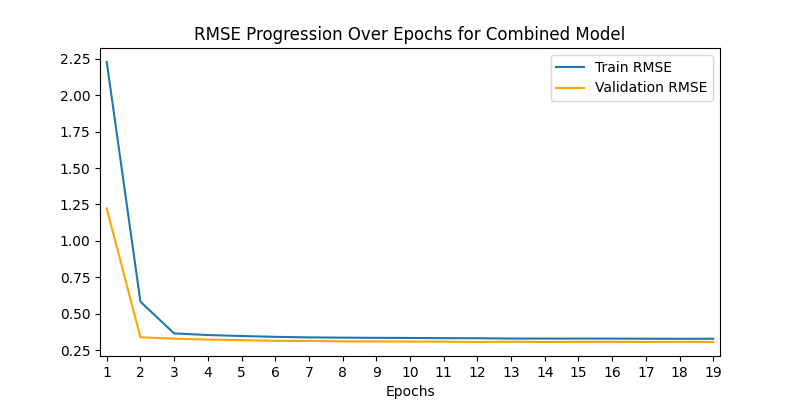

In [181]:
# Import error image
Image(filename="best_combined_model.png")

In [182]:
def test_combined_model(model, test_loader):
    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
    model.to(device) 
    
    model.eval() 
    test_loss = 0.0
    all_predictions = []
    all_targets = []

    with torch.no_grad(): 
        for batch in test_loader:
            # Unpack the batch
            numeric_data, input_ids, attention_mask, target = batch["numeric_data"], batch["input_ids"], batch["attention_mask"], batch["target"]

            # Move data to device
            numeric_data = numeric_data.to(device)
            input_ids = input_ids.to(device)
            attention_mask = attention_mask.to(device)
            target = target.to(device)

            # Forward pass
            outputs = model(numeric_data, input_ids, attention_mask)
            
            # Compute loss
            loss = rmse_loss(outputs, target)
            test_loss += loss.item()

            all_predictions.extend(outputs.cpu().numpy())
            all_targets.extend(target.cpu().numpy())

    # RMSE
    test_rmse = test_loss / len(test_loader) 
    
    return test_rmse

The results are looking very promising: the combination model achieved a test RMSE of 0.3083, surpassing the performance of all other models we tested. This significant improvement with the CombModel underlines the power of integrating different types of models and using different kinds of data to optimize predictive performance.

In [183]:
# Test the model
test_rmse = test_combined_model(comb_model, test_loader)
print(f"Test RMSE: {test_rmse:.4f}")

Test RMSE: 0.3083


In [184]:
# Add DistilBERT to RMSE table
df_rmse.loc[len(df_rmse)] = ["CombModel", test_rmse]
df_rmse

,Model,RMSE
0,Linear Regression,0.417914
1,Random Forest,0.376473
2,XGBoost,0.359553
3,FFNN,0.365037
4,LSTM,0.427671
5,BiLSTM,0.433525
6,DistilBERT,0.397263
7,CombModel,0.308349


### 6. Application to Test Set

Now we just need to use our final combined model to predict the Kaggle test data. Therefore, we implement the predict_model function, which gives us a prediction that we only need to transform by taking the exp of the predictions, since we used the log transformation in the beginning for the price. 

In [185]:
if len(df_num2_scaled) == len(df_bert2):
    print(f"Test Data has same number of rows {len(df_bert2)}")

Test Data has same number of rows 29769


In [186]:
def predict_model(model, test_loader):
    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
    model.to(device) 

    model.eval()
    predictions = []

    with torch.no_grad():
        for batch in test_loader:
            
            # Unpack the batch
            numeric_data = batch["numeric_data"].to(device)
            input_ids = batch["input_ids"].to(device)
            attention_mask = batch["attention_mask"].to(device)

            # Forward 
            outputs = model(numeric_data, input_ids, attention_mask)
            
            # Predictions
            predictions.extend(outputs.cpu().numpy().flatten())

    return predictions

In [187]:
# Predict final Kaggle test data
predictions = predict_model(comb_model, test_loader2)

# Exp predictions
final_predictions = np.exp(predictions)
final_predictions[:5]

array([135.96408 , 116.450066,  62.62775 ,  57.933598, 124.54606 ],
      dtype=float32)

In [188]:
# Check
if len(final_predictions) == len(df_pred):
    print(f"Prediction Data has same number of rows {len(df_bert2)}")

Prediction Data has same number of rows 29769


Now we have the final prediction that we download to upload it on Kaggle to get final RMSE.

In [189]:
# Transform to pred
df_pred = df_pred.to_frame()
df_pred["price"] = final_predictions
df_pred.head(5)

,listing_id,price
0,0FEMC4VA5U,135.964081
1,PQ2BYEO0QR,116.450066
2,3FP6WFHUBN,62.627750
3,GG0V2KDG90,57.933598
4,TZVVK4YSIO,124.546059


In [190]:
# Save predictions on local device
df_pred.to_csv("predictions.csv", index=False)

### 7. Conclusion

Our mission was to predict rental prices for Airbnb accommodation in London for one night. With access to data on more than 55,000 properties, including both textual and numerical attributes, we took a methodical and structured approach. We began with a detailed EDA, followed by careful preprocessing of both the numerical and textual data. Various models, including Linear Regression, Random Forest, XGBoost and more advanced techniques such as LSTM, BiLSTM and DistilBERT, were implemented and evaluated.

Despite our careful preparation and analysis, the final result on Kaggle was a bit disappointing with an RMSE of only 0.4743 (on log scale, 47.43 in unlogged scale). While our internal test RMSE was 0.3083 in the final combined model, indicating a well performing model, the Kaggle result showed that our models may not perform as well in the real world. This shows how important it is to test and fit models in real world conditions, and how big the differences between internal tests and actual applications can be.

However, there are some **limitations** in our approach that could have reduced our kaggle RMSE score even further. First, we limited ourselves to basic training and testing data and did not include review data that might have helped improve prediction accuracy. Secondly, the potential of the images that could have been downloaded from the URLs in the data was not used. The inclusion of a CNN model tailored to the interpretation of these images might have further refined our predictions. Third, the structuring of our dataset is worth mentioning. We set aside 70% of the data for training on purpose, and 15% each for validation and testing, in order to ensure that the robustness of our model was tested in depth. Initially, the plan was to retrain the models with the best test RMSE scores on 100% of the training data to optimally predict the test data on Kaggle. Unfortunately, the problem arose that the overwhelming computational power of our models made it impossible to train again with the full data set. Since I had already purchased GPU training resources from Google Colab three times, rerunning the models on the entire dataset was not only resource intensive, but also economically exhausting.

In summary, predicting Airbnb rental prices in a city as diverse and dynamic as London is a complex task. There is always room for improvement and adjustment, and it is important to learn from experience and constantly seek better solutions. 

In [191]:
# Final test results
df_rmse

,Model,RMSE
0,Linear Regression,0.417914
1,Random Forest,0.376473
2,XGBoost,0.359553
3,FFNN,0.365037
4,LSTM,0.427671
5,BiLSTM,0.433525
6,DistilBERT,0.397263
7,CombModel,0.308349
